$\newcommand{\vct}[1]{\boldsymbol{#1}}
\newcommand{\mtx}[1]{\mathbf{#1}}
\newcommand{\tr}{^\mathrm{T}}
\newcommand{\reals}{\mathbb{R}}
\newcommand{\lpa}{\left(}
\newcommand{\rpa}{\right)}
\newcommand{\lsb}{\left[}
\newcommand{\rsb}{\right]}
\newcommand{\lbr}{\left\lbrace}
\newcommand{\rbr}{\right\rbrace}
\newcommand{\fset}[1]{\lbr #1 \rbr}
\newcommand{\pd}[2]{\frac{\partial #1}{\partial #2}}$

# Background

A neural network is composed of a number of layers, each implementing some transformation. The typical high level implementation of a single such layer (of basic type -> linear transformation plus non-linearity) can be formulated as follows:

\begin{equation}
    \vct{y} = \vct{f}(\mtx{W} \vct{x} + \vct{b})
    \qquad
    \Leftrightarrow
    \qquad
    y_k = f\lpa\sum_{d=1}^D \lpa W_{kd} x_d \rpa + b_k \rpa
\end{equation}

where $\mtx{W}$ and $\vct{b}$ parameterise an affine transformation, and $f$ is a function applied elementwise to the result of the affine transformation. For example a common choice for $f$ is the rectifier linear unit: 

\begin{equation}
  f(u) = max(0,u)
\end{equation}

One can stack an arbitrary number of such transformations, followed by an output layer. This means we can combine implementations of `AffineLayer` class with any non-linear function applied to the outputs just by implementing a layer object for the relevant non-linearity and then stacking the two layers together. 

To give a concrete example, in the `mlp.layers` module there is a definition for a `ReluLayer` equivalent to the following (documentation strings have been removed here for brevity)

```python
class ReluLayer(Layer):
    
    def fprop(self, inputs):
        return np.maximum(inputs, 0.)

    def bprop(self, inputs, outputs, grads_wrt_outputs):
        return (outputs > 0) * grads_wrt_outputs
```

As you can see this `ReluLayer` class has a very lightweight definition, defining just two key methods:

  * `fprop` which takes a batch of activations at the input to the layer and forward propagates them to produce activations at the outputs (directly equivalently to the `fprop` method of `AffineLayer`),
  * `brop` which takes a batch of gradients with respect to the outputs of the layer and back-propagates them to calculate gradients with respect to the inputs of the layer (explained in more detail below).
  
This `ReluLayer` class only implements the rectified linear transformation and so does not have any parameters. Therefore unlike `AffineLayer` it is derived directly from the base `Layer` class rather than `LayerWithParameters` and does not need to implement `grads_wrt_params` or `params` methods. 

To create a model consisting of an affine transformation followed by applying an elementwise rectified linear transformation you can first create a list of the two layer objects (in the order they are applied from inputs to outputs) and then use this to instantiate a new `MultipleLayerModel` object:

```python
from mlp.layers import AffineLayer, ReluLayer
from mlp.models import MultipleLayerModel

layers = [AffineLayer(input_dim, output_dim), ReluLayer()]
model = MultipleLayerModel(layers)
```

You can also stack an arbitrarily long sequence of layers together to produce deeper models. For instance the following would define a model consisting of three pairs of affine and rectified linear transformations.

```python
model = MultipleLayerModel([
    AffineLayer(input_dim, hidden_dim), ReluLayer(),
    AffineLayer(hidden_dim, hidden_dim), ReluLayer(),
    AffineLayer(hidden_dim, output_dim), ReluLayer(),
])
```

## Back-propagation of gradients
 The `bprop` method takes gradients of an error function with respect to the *outputs* of a layer and uses these gradients to calculate gradients of the error function with respect to the *inputs* of a layer. As the inputs to a non-input layer in a multiple-layer model consist of the outputs of the previous layer, this means we can calculate the gradients of the error function with respect to the outputs of every layer in the model by iteratively propagating the gradients backwards through the layers of the model (i.e. from the last to first layer).

For a layer with parameters, the gradients with respect to the layer outputs are required to calculate gradients with respect to the layer parameters. Therefore by combining back-propagation of gradients through the model with computing the gradients with respect to parameters in the relevant layers one can calculate gradients of the error function with respect to all of the parameters of a multiple-layer model in a very efficient manner.

# Task 1: Exploring activation functions

Among other minor things, you are expected to implement the Exponential Linear Unit (ELU), Scaled Exponential Linear Unit (SELU), Gaussian Error Linear Unit (GELU), and the Inverse Square Root Linear Unit (ISRLU) layers (all in the mlp.layers module). Then run several basic experiments on the MNIST benchmark.

Below you are given basic blocks (how to build the model as a whole, define data providers, add optimiser, etc.) to get the whole training pipeline ready.

Your tasks here would be:

1-1) Add the missing layers mentioned above. Show how you arrived at the derivative of the GELU function (2-3 lines of the equation will suffice).

1-2) Establish a baseline network for MNIST using stochastic gradient descent (SGD) and the ReLU activation function. Explore the number of hidden units per layer, number of hidden layers, an appropriate learning rate and initialisation scale range and train for 100 epochs. Justify your choices.

1-3) Modify the baseline network to one that uses each of the above activation functions. Your main aim is to compare the generalization performance of each of these activation functions as well as discover the best possible network configuration when the only available options to choose from are the activation functions and their hyperparameters. Explain your findings.

1-4) Some of these activations have been shown to improve training when paired with special initialisation strategies. Investigate which of them do, implement them and rerun the corresponding optimal networks found in the previous excercise. Explain your findings. 

1-5) Select the optimal network from the exploration above. List possible improvements to the network to achieve better a) accuracy, b) training speed and c) inference speed. Implement one of each a) and b) and explain your observations (ie. did your hypothesis hold or not and why?).

<h3> Task 1-1 </h3>

The missing layers have been implemented in the file mlp/layers.py. Below are some explanations regarding the implementation of each, including a partial derivation of the GELU first derivative, to be used for its backpropagation.

<h4> ELU </h4>

ELU has an additional parameter, alpha, which should be a positive number. The formula was found in the paper [Deep Residual Networks with Exponential Linear](https://dl.acm.org/doi/abs/10.1145/2983402.2983406) Unit by Shah et al. [Clevert et al](https://arxiv.org/pdf/1511.07289.pdf) find that the ELU function converges the cost function faster and is likely to produce more accurate result.

 \begin{align*}
  ELU(x) =&\left\{
    \begin{array}{ll}
      α(e^x - 1), x<0 \\ 
      x, x ≥ 0 \\
    \end{array}
  \right.
\end{align*}

\begin{align*}
  ELU'(x) =&\left\{
    \begin{array}{ll}
      1, x>0 \\ 
      αe^x, x < 0 \\
    \end{array}
  \right.
\end{align*}

<h4> SELU </h4>

The SELU is one of the newer activation functions. A comprehensive explanation of its properties can be found [here](https://arxiv.org/pdf/1706.02515.pdf). The function takes two parameters - λ and α, Klaumbauer et al calculate these parameters to be λ≈1.050700987 and α≈1.673263242. This is consistent with the implementation, too. The equations and their subsequent derivative can be found below.

\begin{align*}
  SELU(x) = λ &\left\{
    \begin{array}{ll}
      x, x>0 \\ 
      αe^x - α, x ≤ 0 \\
    \end{array}
  \right.
\end{align*}

\begin{align*}
  SELU'(x) = λ&\left\{
    \begin{array}{ll}
      1, x>0 \\ 
      αe^x, x ≤ 0 \\
    \end{array}
  \right.
\end{align*}

<h4> GELU </h4>

The GELU is also a rather new activation function, first introduced by [Hendrycks et al](https://arxiv.org/pdf/1606.08415.pdf). This function was introduced in the recent Google's BERT. The activation function is a combination of several functions and some approximated constants as shown below.


\begin{align*}
GELU(x) = 0.5x(1+tanh[\sqrt{\frac{2}{π}}(x + 0.044715x^3)]) \\
\end{align*}

Finding the derivative of the function is somewhat lengthy, so we're going to focus on the beginning of the process. We can first express the GELU(x) equation as follows.

\begin{align*}
GELU(x) = \frac{x(tanh(\frac{\sqrt{2}(\frac{8943x^3}{20000}+x)}{\sqrt{π}})+1)}{2}
\end{align*}

First we're going to pull out constant factors and differentiate the parts of the sum separately.

\begin{align*}
\frac{1}{2} [x(tanh(\frac{\sqrt{2}(\frac{8943x^3}{20000}+x)}{\sqrt{π}}))+1]'
\end{align*}

Next, we're going to apply the product rule:

\begin{align*}
\frac{x'(tanh(\frac{\sqrt{2}(\frac{8943x^3}{20000}+x)}{\sqrt(pi)})+1) + x [tanh(\frac{\sqrt{2}(\frac{8943x^3}{20000}+x)}{\sqrt(pi)})+1]'}{2}
\end{align*}

...

The final version of the drivative takes the following form:
\begin{align*}
GELU'(x) = 0.5tanh(0.0356774x^3 + 0.797885x) + (0.0535161x^3+0.398942x) sech^2(0.0356774x^3+0.797885x) + 0.5
\end{align*}

<h4> ISRLU </h4>

Finally, the ISRLU was examined according to [Carlie et al](https://openreview.net/pdf?id=HkMCybx0-) who suggest the following equations for the activation function and the derivative. The function takes a parameter α.

\begin{align*}
  ISRLU(x) = &\left\{
    \begin{array}{ll}
      x, x≥0 \\ 
      x(\frac{1}{\sqrt{1+αx^2}}), x ≤ 0 \\
    \end{array}
  \right.
\end{align*}

\begin{align*}
  ISRLU'(x) = &\left\{
    \begin{array}{ll}
      1, x≥0 \\ 
      \frac{1}{\sqrt{1+αx^2}}^3, x ≤ 0 \\
    \end{array}
  \right.
\end{align*}


<h3> Task 1-2 </h3>
In this section we focus on experimentation with several hyperparameters. We're going to first tinker with the code provided by the Task itself, and afterwards we're going to run several experiments to examine different hyperparameters, as well as different network architectures. This section also establishes a baseline model.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import logging
from mlp.layers import *
from mlp.errors import CrossEntropyError, CrossEntropySoftmaxError
from mlp.models import SingleLayerModel, MultipleLayerModel
from mlp.initialisers import *
from mlp.learning_rules import GradientDescentLearningRule
from mlp.data_providers import MNISTDataProvider
from mlp.optimisers import Optimiser
%matplotlib inline
plt.style.use('ggplot')

# Seed a random number generator
seed = 6102016 
rng = np.random.RandomState(seed)

# Set up a logger object to print info about the training run to stdout
logger = logging.getLogger()
logger.setLevel(logging.INFO)
logger.handlers = [logging.StreamHandler()]

# Create data provider objects for the MNIST data set
train_data = MNISTDataProvider('train', rng=rng)
valid_data = MNISTDataProvider('valid', rng=rng)
input_dim, output_dim = 784, 10

To minimise replication of code and allow you to run experiments more quickly a helper function is provided below which trains a model and plots the evolution of the error and classification accuracy of the model (on both training and validation sets) over training.

Running the cell below will create a model consisting of an affine layer followed by a softmax transformation and trains it on the MNIST data set by minimising the multi-class cross entropy error function using a basic gradient descent learning rule. By using the helper function defined below, at the end of the training curves of the evolution of the error function and also classification accuracy of the model over the training epochs will be plotted.

You should try running the code for various settings of the training hyperparameters defined at the beginning of the cell to get a feel for how these affect how training proceeds. You may wish to create multiple copies of the cell below to allow you to keep track of and compare the results across different hyperparameter settings.

In [3]:
def train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval):

    # As well as monitoring the error over training also monitor classification
    # accuracy i.e. proportion of most-probable predicted classes being equal to targets
    data_monitors={'acc': lambda y, t: (y.argmax(-1) == t.argmax(-1)).mean()}

    # Use the created objects to initialise a new Optimiser instance.
    optimiser = Optimiser(
        model, error, learning_rule, train_data, valid_data, data_monitors)

    # Run the optimiser for 5 epochs (full passes through the training set)
    # printing statistics every epoch.
    stats, keys, run_time = optimiser.train(num_epochs=num_epochs, stats_interval=stats_interval)

    # Plot the change in the validation and training set error over training.
    fig_1 = plt.figure(figsize=(8, 4))
    ax_1 = fig_1.add_subplot(111)
    for k in ['error(train)', 'error(valid)']:
        ax_1.plot(np.arange(1, stats.shape[0]) * stats_interval, 
                  stats[1:, keys[k]], label=k)
    ax_1.legend(loc=0)
    ax_1.set_xlabel('Epoch number')

    # Plot the change in the validation and training set accuracy over training.
    fig_2 = plt.figure(figsize=(8, 4))
    ax_2 = fig_2.add_subplot(111)
    for k in ['acc(train)', 'acc(valid)']:
        ax_2.plot(np.arange(1, stats.shape[0]) * stats_interval, 
                  stats[1:, keys[k]], label=k)
    ax_2.legend(loc=0)
    ax_2.set_xlabel('Epoch number')
    
    return stats, keys, run_time, fig_1, ax_1, fig_2, ax_2


Below we describe how to build multiple-layer model architectures for the MNIST classification task. 

```python
layers = [
    AffineLayer(input_dim, 100),
    ReluLayer(),
    AffineLayer(100, output_dim),
    ReluLayer()
]
```

An example cell:

In [12]:
# disable logging by setting handler to dummy object
logger.handlers = [logging.NullHandler()]

--------------------------------------------------------------------------------
learning_rate=0.2 init_scale=0.1
--------------------------------------------------------------------------------


Epoch Progress:   4%|██▌                                                             | 20/500 [00:00<00:02, 198.10it/s]


Epoch Progress:  83%|████████████████████████████████████████████████████▍          | 416/500 [00:01<00:00, 258.09it/s]


Epoch Progress:  32%|████████████████████▍                                          | 162/500 [00:00<00:01, 267.66it/s]


Epoch Progress:   5%|███▏                                                            | 25/500 [00:00<00:01, 247.67it/s]


  0%|                                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress:  75%|███████████████████████████████████████████████▍               | 376/500 [00:01<00:00, 265.13it/s]


Epoch Progress:  32%|████████████████████▍                                          | 162/500 [00:00<00:01, 261.36it/s]


Epoch Progress:  85%|█████████████████████████████████████████████████████▋         | 426/500 [00:01<00:00, 259.44it/s]


Epoch Progress:  20%|████████████▋                                                  | 101/500 [00:00<00:02, 160.34it/s]


Epoch Progress:  76%|███████████████████████████████████████████████▊               | 379/500 [00:01<00:00, 286.50it/s]


Epoch Progress:  18%|███████████▍                                                    | 89/500 [00:00<00:01, 285.63it/s]


Epoch Progress:  74%|██████████████████████████████████████████████▊                | 372/500 [00:01<00:00, 260.44it/s]


Epoch Progress:  32%|████████████████████▍                                          | 162/500 [00:00<00:01, 258.22it/s]


Epoch Progress:   3%|█▊                                                              | 14/500 [00:00<00:03, 138.69it/s]


Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [03:34<00:00,  2.14s/it]


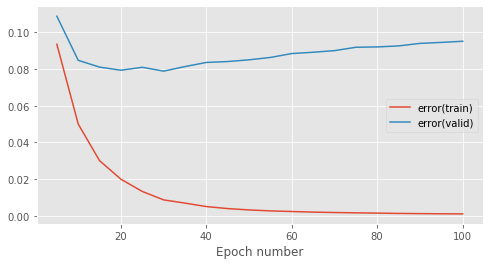

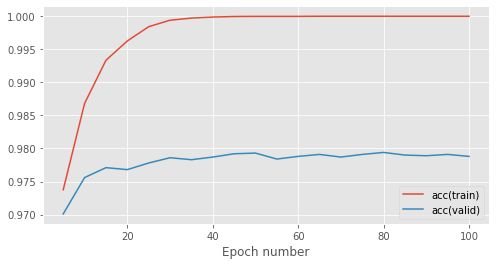

    final error(train) = 1.10e-03
    final error(valid) = 9.51e-02
    final acc(train)   = 1.00e+00
    final acc(valid)   = 9.79e-01
    run time per epoch = 2.15


In [13]:
# Set training run hyperparameters
batch_size = 100  # number of data points in a batch
num_epochs = 100  # number of training epochs to perform
stats_interval = 5  # epoch interval between recording and printing stats
learning_rate = 0.2  # learning rate for gradient descent

init_scales = [0.1]  # scale for random parameter initialisation
final_errors_train = []
final_errors_valid = []
final_accs_train = []
final_accs_valid = []

for init_scale in init_scales:

    print('-' * 80)
    print(f'learning_rate={learning_rate} init_scale={init_scale}')
    print('-' * 80)
    # Reset random number generator and data provider states on each run
    # to ensure reproducibility of results
    rng.seed(seed)
    train_data.reset()
    valid_data.reset()

    # Alter data-provider batch size
    train_data.batch_size = batch_size 
    valid_data.batch_size = batch_size

    # Create a parameter initialiser which will sample random uniform values
    # from [-init_scale, init_scale]
    param_init = UniformInit(-init_scale, init_scale, rng=rng)

    # Create a model with two affine layers
    hidden_dim = 100 #hidden units
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, param_init, param_init),
        ReluLayer(),
        AffineLayer(hidden_dim, output_dim, param_init, param_init)
    ])

    # Initialise a cross entropy error object
    error = CrossEntropySoftmaxError()

    # Use a basic gradient descent learning rule
    learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

    stats, keys, run_time, fig_1, ax_1, fig_2, ax_2 = train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval)
    plt.show()

    print(f'    final error(train) = {stats[-1, keys["error(train)"]]:.2e}')
    print(f'    final error(valid) = {stats[-1, keys["error(valid)"]]:.2e}')
    print(f'    final acc(train)   = {stats[-1, keys["acc(train)"]]:.2e}')
    print(f'    final acc(valid)   = {stats[-1, keys["acc(valid)"]]:.2e}')
    print(f'    run time per epoch = {run_time * 1. / num_epochs:.2f}')

    final_errors_train.append(stats[-1, keys['error(train)']])
    final_errors_valid.append(stats[-1, keys['error(valid)']])
    final_accs_train.append(stats[-1, keys['acc(train)']])
    final_accs_valid.append(stats[-1, keys['acc(valid)']])

<h5> Wrapping the experimentation functions </h5>
After running the initial cell above, we're getting strong hints that the model is overfitting considering the training accuracy is higher than the validation accuracy. There are different parameters that can be tweaked to hopefully improve the performance of the model. Initially, we're going to modify the cell above and wrap it in its own function with input parameters being batch_size, num_epochs, learning_rate, init_scales, hidden_units. We're going to name this cell reproducable_exp_simple. Next, we're going to change the architecture of the network (by adding more hidden layers) and repeat the aforementioned - the new function is titled reproducable_exp_deeper. 

Since the model is overfitting in the cell above, we expect that lowering the learning rate will mitigate overfitting over 100 epochs. Initialising the weights differently may also affect the convergence of the model.

<h5> A brief explanation about the hyperparameters </h5>
The batch_size hyperparameter controls the number of training samples to examine before the model's internal states are updated. Num_epochs controls the number of complete iterations through the full training dataset. As a part of the task we have that num_epochs should always be 100, however given the outputs of the previous cell, it seems that the model is overfitting and a possible technique to mitigate this could be early stopping, i.e. ending the training at an earlier epochs. Next, learning_rate is a hyperparameter controlling how much change the model undergoes in response to an estimated error. Lower learning_rates will lead to slower training times and a slower convergence to a global error minimum. Finally, init_scales initialises the weights of the model using a uniform distribution.


In [26]:
def reproducable_exp_simple(batch_size, num_epochs, learning_rate, init_scales, hidden_units):

    # Set training run hyperparameters
    batch_size = batch_size  # number of data points in a batch
    num_epochs = num_epochs  # number of training epochs to perform
    stats_interval = 5  # epoch interval between recording and printing stats
    learning_rate = learning_rate  # learning rate for gradient descent

    init_scales = [init_scales]  # scale for random parameter initialisation
    final_errors_train = []
    final_errors_valid = []
    final_accs_train = []
    final_accs_valid = []

    for init_scale in init_scales:

        print('-' * 80)
        print(f'learning_rate={learning_rate} init_scale={init_scale}')
        print('-' * 80)
        # Reset random number generator and data provider states on each run
        # to ensure reproducibility of results
        rng.seed(seed)
        train_data.reset()
        valid_data.reset()

        # Alter data-provider batch size
        train_data.batch_size = batch_size 
        valid_data.batch_size = batch_size

        # Create a parameter initialiser which will sample random uniform values
        # from [-init_scale, init_scale]
        param_init = UniformInit(-init_scale, init_scale, rng=rng)

        # Create a model with two affine layers
        hidden_dim = hidden_units #hidden units
        model = MultipleLayerModel([
            AffineLayer(input_dim, hidden_dim, param_init, param_init),
            ReluLayer(),
            AffineLayer(hidden_dim, output_dim, param_init, param_init)
        ])

        # Initialise a cross entropy error object
        error = CrossEntropySoftmaxError()

        # Use a basic gradient descent learning rule
        learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

        stats, keys, run_time, fig_1, ax_1, fig_2, ax_2 = train_model_and_plot_stats(
            model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval)
        plt.show()

        print(f'    final error(train) = {stats[-1, keys["error(train)"]]:.2e}')
        print(f'    final error(valid) = {stats[-1, keys["error(valid)"]]:.2e}')
        print(f'    final acc(train)   = {stats[-1, keys["acc(train)"]]:.2e}')
        print(f'    final acc(valid)   = {stats[-1, keys["acc(valid)"]]:.2e}')
        print(f'    run time per epoch = {run_time * 1. / num_epochs:.2f}')

        final_errors_train.append(stats[-1, keys['error(train)']])
        final_errors_valid.append(stats[-1, keys['error(valid)']])
        final_accs_train.append(stats[-1, keys['acc(train)']])
        final_accs_valid.append(stats[-1, keys['acc(valid)']])

--------------------------------------------------------------------------------
learning_rate=0.2 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:  85%|█████████████████████████████████████████████████████▋         | 426/500 [00:01<00:00, 258.11it/s]


Epoch Progress:  41%|██████████████████████████                                     | 207/500 [00:00<00:01, 259.98it/s]


Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress:  87%|██████████████████████████████████████████████████████▊        | 435/500 [00:01<00:00, 279.54it/s]


Epoch Progress:  73%|██████████████████████████████████████████████▏                | 367/500 [00:01<00:00, 277.07it/s]


Epoch Progress:  61%|██████████████████████████████████████▏                        | 303/500 [00:01<00:00, 297.02it/s]


Epoch Progress:  43%|██████████████████████████▉                                    | 214/500 [00:00<00:01, 283.40it/s]


Epoch Progress:  42%|██████████████████████████▌                                    | 211/500 [00:00<00:00, 297.07it/s]


Epoch Progress:  11%|██████▊                                                         | 53/500 [00:00<00:01, 248.27it/s]


Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress:  11%|███████▎                                                        | 57/500 [00:00<00:01, 258.95it/s]


Epoch Progress:  24%|███████████████▎                                               | 122/500 [00:00<00:01, 290.21it/s]


Epoch Progress:  30%|██████████████████▉                                            | 150/500 [00:00<00:01, 293.49it/s]


Epoch Progress:  31%|███████████████████▎                                           | 153/500 [00:00<00:01, 300.36it/s]


Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [03:21<00:00,  2.02s/it]


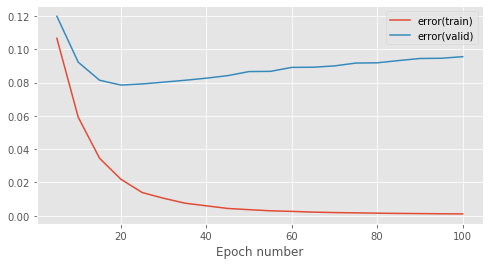

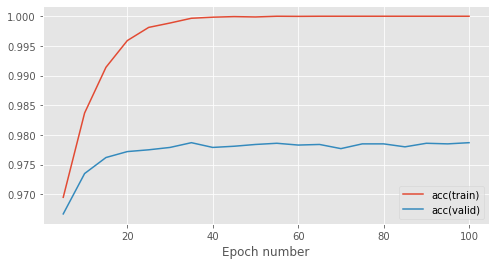

    final error(train) = 1.13e-03
    final error(valid) = 9.55e-02
    final acc(train)   = 1.00e+00
    final acc(valid)   = 9.79e-01
    run time per epoch = 2.03


In [22]:
reproducable_exp_simple(100, 100, 0.2, 0.01,100) #Initialising differently, closer to 0

Changing the weights, (as expected) did not do too much to change the outcome of the model for now. We've achieved a slightly higher error, similar accuracy on the validation set, however the model is still very much overfitting. Our next experiment will seek to lower the learning rate.

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:  25%|███████████████▉                                               | 126/500 [00:00<00:01, 304.45it/s]


Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress:  17%|██████████▌                                                     | 83/500 [00:00<00:01, 267.83it/s]


Epoch Progress:  10%|██████▌                                                         | 51/500 [00:00<00:01, 225.97it/s]


Epoch Progress:  45%|████████████████████████████▌                                  | 227/500 [00:00<00:00, 304.78it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 302.84it/s]


Epoch Progress:  33%|████████████████████▋                                          | 164/500 [00:00<00:01, 321.78it/s]


Epoch Progress:  90%|████████████████████████████████████████████████████████▉      | 452/500 [00:01<00:00, 297.74it/s]


Epoch Progress:  51%|████████████████████████████████▍                              | 257/500 [00:00<00:00, 318.33it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 303.39it/s]


Epoch Progress:  33%|████████████████████▊                                          | 165/500 [00:00<00:01, 320.98it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 271.45it/s]


Epoch Progress:   5%|██▉                                                             | 23/500 [00:00<00:02, 225.62it/s]


Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [03:11<00:00,  1.92s/it]


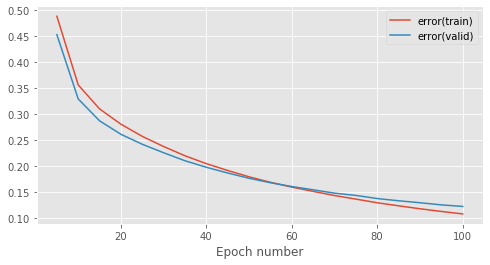

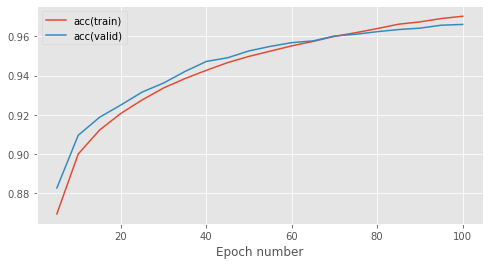

    final error(train) = 1.08e-01
    final error(valid) = 1.22e-01
    final acc(train)   = 9.70e-01
    final acc(valid)   = 9.66e-01
    run time per epoch = 1.92


In [23]:
reproducable_exp_simple(100, 100, 0.01, 0.01,100)

As expected, lowering the learning rate prevented the model from overfitting. According to the graph plotting training and validation accuracy, we're starting to overfit the model around the 70th epoch. However, due to the very low learning rate, by the 100th epoch, the model is still performing well. The accuracy here is a little lower than our previous example, however the model is far more reliable.

Let's finally see what outcome we get if we lower the batch size (and return the weight initialising to its previous value).

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:   3%|█▊                                                             | 44/1562 [00:00<00:03, 435.89it/s]


Epoch Progress:  67%|█████████████████████████████████████████                    | 1050/1562 [00:01<00:00, 554.29it/s]


Epoch Progress:  15%|█████████▏                                                    | 233/1562 [00:00<00:02, 560.78it/s]


Experiment Progress:  18%|██████████▊                                                 | 18/100 [00:55<03:53,  2.85s/it]


Epoch Progress:  59%|████████████████████████████████████▌                         | 922/1562 [00:01<00:01, 608.34it/s]


Epoch Progress:  17%|██████████▋                                                   | 269/1562 [00:00<00:02, 473.28it/s]


Experiment Progress:  32%|███████████████████▏                                        | 32/100 [01:38<03:17,  2.90s/it]


Epoch Progress:  79%|████████████████████████████████████████████████▏            | 1233/1562 [00:02<00:00, 594.59it/s]


Epoch Progress:  51%|███████████████████████████████▊                              | 803/1562 [00:01<00:01, 610.37it/s]


Epoch Progress:  27%|████████████████▊                                             | 424/1562 [00:00<00:01, 592.47it/s]


Epoch Progress:   0%|                                                                         | 0/1562 [00:00<?, ?it/s]


Epoch Progress:  90%|███████████████████████████████████████████████████████▏     | 1413/1562 [00:02<00:00, 615.71it/s]


Epoch Progress:  71%|███████████████████████████████████████████▍                 | 1111/1562 [00:01<00:00, 603.18it/s]


Epoch Progress:  22%|█████████████▋                                                | 345/1562 [00:00<00:03, 355.20it/s]


Epoch Progress:  68%|█████████████████████████████████████████▍                   | 1061/1562 [00:01<00:00, 574.46it/s]


Epoch Progress:  34%|████████████████████▉                                         | 528/1562 [00:00<00:01, 572.80it/s]


  0%|                                                                                         | 0/1562 [00:00<?, ?it/s]


Epoch Progress:  70%|██████████████████████████████████████████▍                  | 1087/1562 [00:01<00:00, 600.01it/s]


Epoch Progress:  29%|██████████████████▎                                           | 460/1562 [00:00<00:01, 567.74it/s]


  0%|                                                                                         | 0/1562 [00:00<?, ?it/s]


Epoch Progress:  72%|███████████████████████████████████████████▋                 | 1119/1562 [00:01<00:00, 600.91it/s]


Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [05:01<00:00,  3.01s/it]


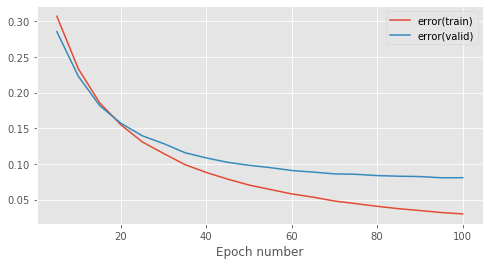

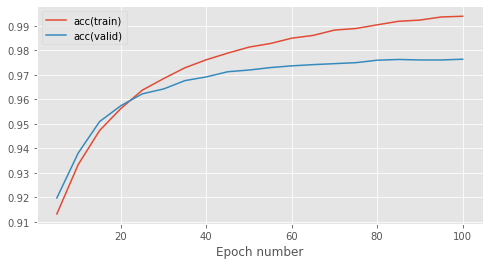

    final error(train) = 3.00e-02
    final error(valid) = 8.08e-02
    final acc(train)   = 9.94e-01
    final acc(valid)   = 9.76e-01
    run time per epoch = 3.02


In [25]:
reproducable_exp_simple(32, 100, 0.01, 0.01, 100)

Decreasing the batch size sped up the convergence of the model, however according to the accuracy graph above, the model is once again overfitting. Due to this, accuracy improvements cannot be relied upon. Next, let's try to incease the number of hidden units.

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:  44%|████████████████████████████                                    | 219/500 [00:02<00:02, 98.67it/s]


Epoch Progress:   1%|▊                                                                 | 6/500 [00:00<00:09, 54.58it/s]


Epoch Progress:  56%|███████████████████████████████████▉                            | 281/500 [00:02<00:02, 92.34it/s]


Epoch Progress:  22%|██████████████                                                 | 112/500 [00:01<00:03, 102.38it/s]


Epoch Progress: 100%|████████████████████████████████████████████████████████████████| 500/500 [00:05<00:00, 99.76it/s]


Epoch Progress:  64%|████████████████████████████████████████▊                       | 319/500 [00:03<00:01, 91.95it/s]


Epoch Progress:  37%|███████████████████████                                        | 183/500 [00:01<00:03, 101.68it/s]


Epoch Progress:   8%|█████▏                                                           | 40/500 [00:00<00:04, 95.86it/s]


Epoch Progress:  85%|█████████████████████████████████████████████████████▍         | 424/500 [00:04<00:00, 103.55it/s]


Epoch Progress:  50%|███████████████████████████████▌                               | 250/500 [00:02<00:02, 102.40it/s]


Epoch Progress:  21%|█████████████▏                                                 | 105/500 [00:01<00:03, 101.45it/s]


Epoch Progress: 100%|████████████████████████████████████████████████████████████████| 500/500 [00:05<00:00, 99.40it/s]


Epoch Progress:  72%|█████████████████████████████████████████████                  | 358/500 [00:03<00:01, 102.92it/s]


Epoch Progress:  40%|█████████████████████████▍                                     | 202/500 [00:01<00:02, 102.13it/s]


Epoch Progress:  11%|██████▊                                                         | 53/500 [00:00<00:04, 100.69it/s]


Epoch Progress:  75%|███████████████████████████████████████████████▋                | 373/500 [00:04<00:01, 95.48it/s]


Epoch Progress:  41%|█████████████████████████▉                                     | 206/500 [00:02<00:02, 103.75it/s]


Epoch Progress:  10%|██████▋                                                          | 51/500 [00:00<00:04, 95.00it/s]


Epoch Progress:  87%|███████████████████████████████████████████████████████▍        | 433/500 [00:04<00:00, 93.42it/s]


Epoch Progress:  50%|███████████████████████████████▏                               | 248/500 [00:02<00:02, 102.37it/s]


Epoch Progress:   3%|██                                                               | 16/500 [00:00<00:06, 72.50it/s]


Epoch Progress:  74%|██████████████████████████████████████████████▍                | 369/500 [00:03<00:01, 103.75it/s]


Epoch Progress:  46%|████████████████████████████▊                                  | 229/500 [00:02<00:02, 105.64it/s]


Epoch Progress:  19%|████████████▏                                                   | 95/500 [00:00<00:04, 100.29it/s]


Epoch Progress:  96%|████████████████████████████████████████████████████████████▍  | 480/500 [00:04<00:00, 104.28it/s]


Epoch Progress:  70%|████████████████████████████████████████████▎                  | 352/500 [00:03<00:01, 103.39it/s]


Epoch Progress:  39%|████████████████████████▌                                      | 195/500 [00:01<00:02, 104.88it/s]


Epoch Progress:  13%|████████▎                                                       | 65/500 [00:00<00:04, 102.21it/s]


Epoch Progress:  82%|████████████████████████████████████████████████████▏           | 408/500 [00:04<00:00, 95.22it/s]


Epoch Progress:  41%|█████████████████████████▉                                      | 203/500 [00:02<00:03, 88.12it/s]


Epoch Progress:  82%|████████████████████████████████████████████████████▋           | 412/500 [00:04<00:01, 86.79it/s]


Epoch Progress:  18%|███████████▊                                                     | 91/500 [00:01<00:04, 83.15it/s]


Epoch Progress:  61%|██████████████████████████████████████▊                         | 303/500 [00:03<00:02, 88.29it/s]


Epoch Progress:  97%|█████████████████████████████████████████████████████████████▊  | 483/500 [00:05<00:00, 85.13it/s]


Epoch Progress:  34%|█████████████████████▉                                          | 171/500 [00:02<00:03, 86.62it/s]


Epoch Progress:  48%|██████████████████████████████▉                                 | 242/500 [00:03<00:04, 53.53it/s]


Epoch Progress:  74%|███████████████████████████████████████████████▎                | 370/500 [00:04<00:01, 85.82it/s]


  0%|                                                                                          | 0/500 [00:00<?, ?it/s]


Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [09:21<00:00,  5.61s/it]


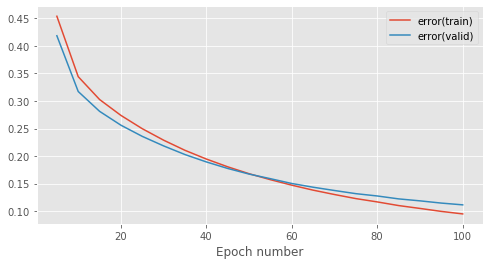

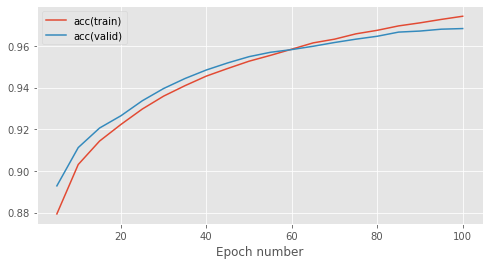

    final error(train) = 9.50e-02
    final error(valid) = 1.11e-01
    final acc(train)   = 9.74e-01
    final acc(valid)   = 9.68e-01
    run time per epoch = 5.63


In [27]:
reproducable_exp_simple(100, 100, 0.01, 0.01, 300)

Increasing the number of hidden units to 300 increased the error in comparison to the former model when we used 100 units. Perhaps a decrease to the hidden units to less than 100 would be better.

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:  48%|██████████████████████████████                                 | 239/500 [00:00<00:00, 383.32it/s]


Experiment Progress:  18%|██████████▊                                                 | 18/100 [00:26<01:52,  1.38s/it]


  0%|                                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress:  25%|███████████████▍                                               | 123/500 [00:00<00:00, 385.64it/s]


Experiment Progress:  45%|███████████████████████████                                 | 45/100 [01:07<01:33,  1.70s/it]


Epoch Progress:  63%|███████████████████████████████████████▌                       | 314/500 [00:00<00:00, 294.12it/s]


Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress:  70%|███████████████████████████████████████████▊                   | 348/500 [00:01<00:00, 336.39it/s]


Epoch Progress:  47%|█████████████████████████████▌                                 | 235/500 [00:00<00:01, 250.93it/s]


Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


  0%|                                                                                          | 0/500 [00:00<?, ?it/s]


Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [02:33<00:00,  1.54s/it]


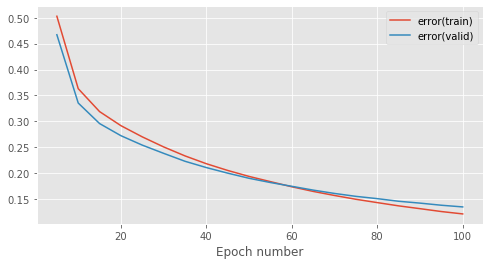

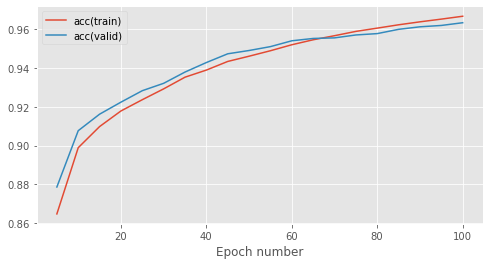

    final error(train) = 1.21e-01
    final error(valid) = 1.34e-01
    final acc(train)   = 9.67e-01
    final acc(valid)   = 9.63e-01
    run time per epoch = 1.54


In [28]:
reproducable_exp_simple(100, 100, 0.01, 0.01, 64)

Using fewer hidden units also seems to decrease accuracy and cause the model to overfit slightly.

Next, we're going to deepen the network by adding one more Affine and Relu layer in between. Afterwards, we're going to perform all five experiments with the same values for the hyperparameters (to ensure consistency). Once we complete the experiments, we will compare the architectures between each other to find the best model out of the ones we have thus far attempted.

In [32]:
def reproducable_exp_deeper(batch_size, num_epochs, learning_rate, init_scales, hidden_units):

    # Set training run hyperparameters
    batch_size = batch_size  # number of data points in a batch
    num_epochs = num_epochs  # number of training epochs to perform
    stats_interval = 5  # epoch interval between recording and printing stats
    learning_rate = learning_rate  # learning rate for gradient descent

    init_scales = [init_scales]  # scale for random parameter initialisation
    final_errors_train = []
    final_errors_valid = []
    final_accs_train = []
    final_accs_valid = []

    for init_scale in init_scales:

        print('-' * 80)
        print(f'learning_rate={learning_rate} init_scale={init_scale}')
        print('-' * 80)
        # Reset random number generator and data provider states on each run
        # to ensure reproducibility of results
        rng.seed(seed)
        train_data.reset()
        valid_data.reset()

        # Alter data-provider batch size
        train_data.batch_size = batch_size 
        valid_data.batch_size = batch_size

        # Create a parameter initialiser which will sample random uniform values
        # from [-init_scale, init_scale]
        param_init = UniformInit(-init_scale, init_scale, rng=rng)

        # Create a model with two affine layers
        hidden_dim = hidden_units #hidden units
        model = MultipleLayerModel([
            AffineLayer(input_dim, hidden_dim, param_init, param_init),
            ReluLayer(),
            AffineLayer(hidden_dim, hidden_dim, param_init, param_init),
            ReluLayer(),
            AffineLayer(hidden_dim, output_dim, param_init, param_init)
        ])

        # Initialise a cross entropy error object
        error = CrossEntropySoftmaxError()

        # Use a basic gradient descent learning rule
        learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

        stats, keys, run_time, fig_1, ax_1, fig_2, ax_2 = train_model_and_plot_stats(
            model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval)
        plt.show()

        print(f'    final error(train) = {stats[-1, keys["error(train)"]]:.2e}')
        print(f'    final error(valid) = {stats[-1, keys["error(valid)"]]:.2e}')
        print(f'    final acc(train)   = {stats[-1, keys["acc(train)"]]:.2e}')
        print(f'    final acc(valid)   = {stats[-1, keys["acc(valid)"]]:.2e}')
        print(f'    run time per epoch = {run_time * 1. / num_epochs:.2f}')

        final_errors_train.append(stats[-1, keys['error(train)']])
        final_errors_valid.append(stats[-1, keys['error(valid)']])
        final_accs_train.append(stats[-1, keys['acc(train)']])
        final_accs_valid.append(stats[-1, keys['acc(valid)']])

--------------------------------------------------------------------------------
learning_rate=0.2 init_scale=0.1
--------------------------------------------------------------------------------


Epoch Progress:  20%|████████████▋                                                  | 101/500 [00:00<00:01, 245.92it/s]


Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress:   4%|██▊                                                             | 22/500 [00:00<00:02, 213.71it/s]


Epoch Progress:  20%|████████████▋                                                  | 101/500 [00:00<00:01, 232.62it/s]


Epoch Progress:  31%|███████████████████▋                                           | 156/500 [00:00<00:01, 251.95it/s]


Epoch Progress:  34%|█████████████████████▏                                         | 168/500 [00:00<00:01, 241.26it/s]


Epoch Progress:  51%|████████████████████████████████                               | 254/500 [00:01<00:00, 251.31it/s]


Epoch Progress:  68%|███████████████████████████████████████████                    | 342/500 [00:01<00:00, 256.68it/s]


Epoch Progress:  78%|█████████████████████████████████████████████████▍             | 392/500 [00:01<00:00, 255.22it/s]


Epoch Progress:  84%|████████████████████████████████████████████████████▉          | 420/500 [00:01<00:00, 254.07it/s]


Epoch Progress:  47%|█████████████████████████████▌                                 | 235/500 [00:01<00:01, 239.81it/s]


Epoch Progress:  24%|███████████████▎                                               | 122/500 [00:00<00:01, 200.38it/s]


Epoch Progress:  36%|██████████████████████▉                                        | 182/500 [00:00<00:01, 253.62it/s]


Epoch Progress:  38%|████████████████████████▏                                      | 192/500 [00:00<00:01, 235.17it/s]


Epoch Progress:  55%|██████████████████████████████████▌                            | 274/500 [00:01<00:00, 243.00it/s]


Epoch Progress:  32%|████████████████████▏                                          | 160/500 [00:00<00:01, 225.23it/s]


Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [03:59<00:00,  2.40s/it]


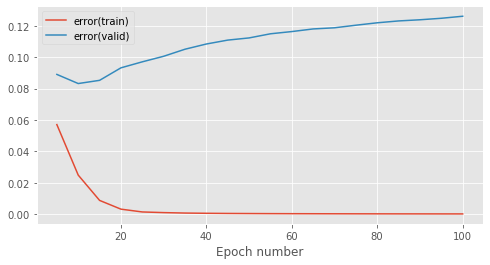

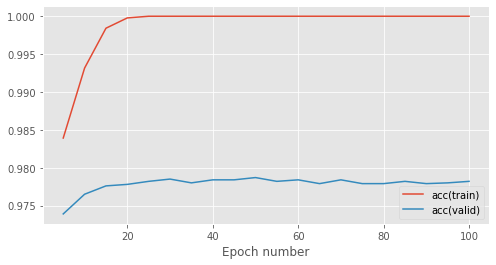

    final error(train) = 1.38e-04
    final error(valid) = 1.26e-01
    final acc(train)   = 1.00e+00
    final acc(valid)   = 9.78e-01
    run time per epoch = 2.41


In [33]:
reproducable_exp_deeper(100, 100, 0.2, 0.1, 100) #Same parameters as the first experiment,with a deeper network

--------------------------------------------------------------------------------
learning_rate=0.2 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:  56%|███████████████████████████████████▌                           | 282/500 [00:01<00:00, 249.07it/s]


Epoch Progress:  56%|███████████████████████████████████▍                           | 281/500 [00:01<00:00, 245.01it/s]


Epoch Progress:  16%|██████████                                                      | 79/500 [00:00<00:02, 183.48it/s]


Epoch Progress:  66%|█████████████████████████████████████████▊                     | 332/500 [00:01<00:00, 222.37it/s]


Epoch Progress:  38%|███████████████████████▉                                       | 190/500 [00:00<00:01, 235.10it/s]


Epoch Progress:  62%|███████████████████████████████████████                        | 310/500 [00:01<00:00, 220.05it/s]


Epoch Progress:  91%|█████████████████████████████████████████████████████████▏     | 454/500 [00:02<00:00, 216.91it/s]


Epoch Progress:  85%|█████████████████████████████████████████████████████▍         | 424/500 [00:02<00:00, 191.28it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 186.47it/s]


Epoch Progress:  12%|███████▍                                                        | 58/500 [00:00<00:02, 182.37it/s]


Epoch Progress:  42%|██████████████████████████▌                                    | 211/500 [00:01<00:01, 202.88it/s]


Epoch Progress:  64%|████████████████████████████████████████                       | 318/500 [00:01<00:00, 208.12it/s]


Epoch Progress:  94%|███████████████████████████████████████████████████████████▍   | 472/500 [00:02<00:00, 187.29it/s]


Epoch Progress:   8%|████▉                                                           | 39/500 [00:00<00:02, 192.43it/s]


Epoch Progress:  39%|████████████████████████▊                                      | 197/500 [00:00<00:01, 217.17it/s]


Epoch Progress:  68%|██████████████████████████████████████████▌                    | 338/500 [00:01<00:00, 207.35it/s]


Epoch Progress:  82%|███████████████████████████████████████████████████▊           | 411/500 [00:01<00:00, 215.77it/s]


  0%|                                                                                          | 0/500 [00:00<?, ?it/s]


Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [04:29<00:00,  2.70s/it]


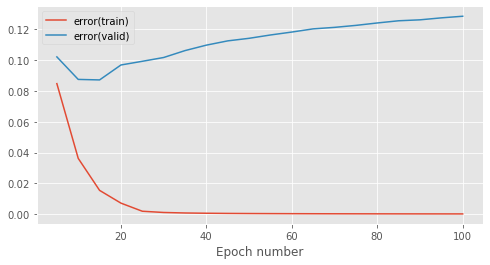

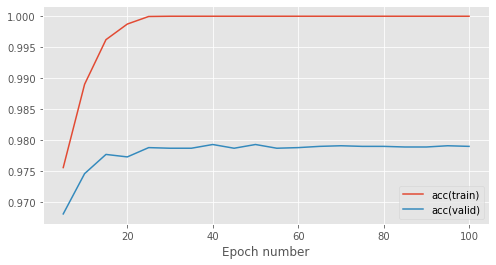

    final error(train) = 1.38e-04
    final error(valid) = 1.28e-01
    final acc(train)   = 1.00e+00
    final acc(valid)   = 9.79e-01
    run time per epoch = 2.70


In [34]:
reproducable_exp_deeper(100, 100, 0.2, 0.01, 100) #Same parameters as the first experiment,with a deeper network

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:   4%|██▍                                                             | 19/500 [00:00<00:02, 182.80it/s]


Epoch Progress:  87%|██████████████████████████████████████████████████████▋        | 434/500 [00:01<00:00, 230.26it/s]


Epoch Progress:  46%|█████████████████████████████▏                                 | 232/500 [00:01<00:01, 219.37it/s]


Epoch Progress:   4%|██▍                                                             | 19/500 [00:00<00:02, 184.57it/s]


Epoch Progress:  85%|█████████████████████████████████████████████████████▋         | 426/500 [00:01<00:00, 202.49it/s]


Epoch Progress:  49%|██████████████████████████████▌                                | 243/500 [00:01<00:01, 242.20it/s]


Epoch Progress:   9%|█████▉                                                          | 46/500 [00:00<00:02, 218.53it/s]


Epoch Progress:  93%|██████████████████████████████████████████████████████████▍    | 464/500 [00:02<00:00, 209.51it/s]


Epoch Progress:  77%|████████████████████████████████████████████████▎              | 383/500 [00:01<00:00, 246.86it/s]


Epoch Progress:  73%|█████████████████████████████████████████████▋                 | 363/500 [00:01<00:00, 231.88it/s]


Epoch Progress:  23%|██████████████▍                                                | 115/500 [00:00<00:01, 217.33it/s]


Epoch Progress:  14%|█████████▏                                                      | 72/500 [00:00<00:01, 224.54it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 220.88it/s]


Epoch Progress:  77%|████████████████████████████████████████████████▎              | 383/500 [00:01<00:00, 201.78it/s]


Epoch Progress:  48%|██████████████████████████████▍                                | 242/500 [00:01<00:01, 238.05it/s]


Epoch Progress:  18%|███████████▊                                                    | 92/500 [00:00<00:01, 218.02it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 227.30it/s]


Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [04:04<00:00,  2.45s/it]


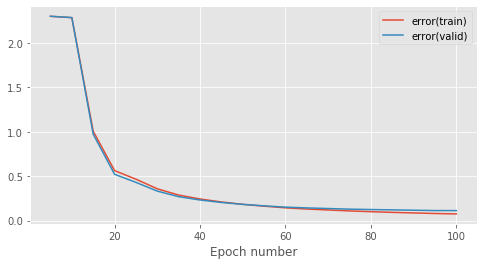

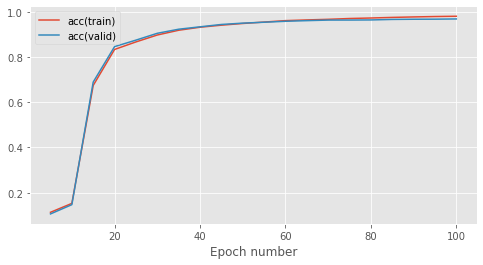

    final error(train) = 7.51e-02
    final error(valid) = 1.13e-01
    final acc(train)   = 9.80e-01
    final acc(valid)   = 9.68e-01
    run time per epoch = 2.46


In [39]:
reproducable_exp_deeper(100, 100, 0.01, 0.01, 100) #Same parameters as the first experiment,with a deeper network

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:  69%|██████████████████████████████████████████                   | 1076/1562 [00:03<00:02, 180.44it/s]


Epoch Progress:  38%|███████████████████████▊                                      | 599/1562 [00:03<00:05, 187.50it/s]


Epoch Progress:  63%|███████████████████████████████████████▏                      | 987/1562 [00:04<00:02, 228.62it/s]


Epoch Progress:  87%|█████████████████████████████████████████████████████        | 1359/1562 [00:05<00:00, 214.99it/s]


Epoch Progress:  95%|█████████████████████████████████████████████████████████▊   | 1480/1562 [00:03<00:00, 326.98it/s]


Epoch Progress:   9%|█████▋                                                        | 143/1562 [00:00<00:04, 336.99it/s]


Epoch Progress:  39%|████████████████████████▍                                     | 616/1562 [00:01<00:02, 406.75it/s]


Epoch Progress:  45%|████████████████████████████                                  | 706/1562 [00:02<00:02, 340.74it/s]


Epoch Progress:  19%|███████████▊                                                  | 297/1562 [00:00<00:03, 367.30it/s]


Epoch Progress:  16%|██████████                                                    | 255/1562 [00:00<00:03, 358.37it/s]


Epoch Progress:  13%|███████▉                                                      | 200/1562 [00:00<00:03, 383.34it/s]


Epoch Progress:   9%|█████▋                                                        | 144/1562 [00:00<00:04, 285.01it/s]


Epoch Progress:  39%|████████████████████████                                      | 605/1562 [00:01<00:02, 391.38it/s]


Epoch Progress:  62%|██████████████████████████████████████▍                       | 969/1562 [00:02<00:01, 328.71it/s]


Epoch Progress:  21%|█████████████                                                 | 330/1562 [00:01<00:06, 189.31it/s]


Epoch Progress:  37%|██████████████████████▊                                       | 574/1562 [00:02<00:04, 221.44it/s]


Epoch Progress:  72%|███████████████████████████████████████████▉                 | 1125/1562 [00:03<00:01, 299.40it/s]


Epoch Progress:  57%|███████████████████████████████████▏                          | 887/1562 [00:02<00:01, 355.04it/s]


Epoch Progress:  77%|███████████████████████████████████████████████▎             | 1210/1562 [00:03<00:00, 393.80it/s]


Epoch Progress:  72%|███████████████████████████████████████████▉                 | 1125/1562 [00:03<00:01, 249.49it/s]


Epoch Progress:  85%|███████████████████████████████████████████████████▊         | 1326/1562 [00:03<00:00, 374.70it/s]


Epoch Progress:   0%|                                                                         | 0/1562 [00:00<?, ?it/s]


Epoch Progress:  96%|██████████████████████████████████████████████████████████▌  | 1498/1562 [00:05<00:00, 335.98it/s]


Epoch Progress:  78%|███████████████████████████████████████████████▍             | 1215/1562 [00:03<00:01, 319.12it/s]


Epoch Progress:  49%|██████████████████████████████▎                               | 765/1562 [00:02<00:02, 330.64it/s]


Epoch Progress:  31%|██████████████████▉                                           | 477/1562 [00:01<00:02, 385.64it/s]


Epoch Progress:  12%|███████▌                                                      | 191/1562 [00:00<00:04, 294.90it/s]


Epoch Progress:  97%|███████████████████████████████████████████████████████████▎ | 1518/1562 [00:04<00:00, 327.78it/s]


Epoch Progress:  85%|███████████████████████████████████████████████████▉         | 1331/1562 [00:03<00:00, 358.78it/s]


Epoch Progress:  82%|█████████████████████████████████████████████████▉           | 1279/1562 [00:03<00:00, 302.54it/s]


Epoch Progress:  59%|████████████████████████████████████▎                         | 915/1562 [00:03<00:02, 263.48it/s]


Epoch Progress:  87%|████████████████████████████████████████████████████▉        | 1357/1562 [00:03<00:00, 458.89it/s]


Epoch Progress:  42%|█████████████████████████▉                                    | 653/1562 [00:01<00:02, 423.85it/s]


Epoch Progress:  69%|██████████████████████████████████████████▏                  | 1080/1562 [00:02<00:01, 380.78it/s]


Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [08:33<00:00,  5.13s/it]


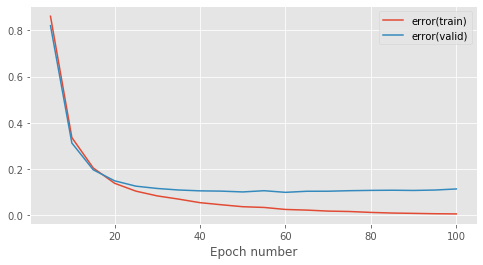

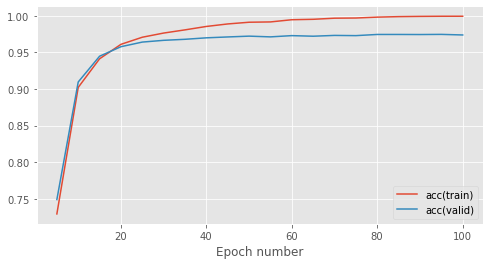

    final error(train) = 6.76e-03
    final error(valid) = 1.15e-01
    final acc(train)   = 9.99e-01
    final acc(valid)   = 9.74e-01
    run time per epoch = 5.15


In [36]:
reproducable_exp_deeper(32, 100, 0.01, 0.01, 100) #Same parameters as the first experiment,with a deeper network

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:  91%|██████████████████████████████████████████████████████████▍     | 457/500 [00:06<00:00, 58.55it/s]


Epoch Progress:  75%|███████████████████████████████████████████████▋                | 373/500 [00:06<00:01, 68.09it/s]


Epoch Progress:  64%|█████████████████████████████████████████▏                      | 322/500 [00:04<00:02, 68.33it/s]


Epoch Progress:  78%|██████████████████████████████████████████████████              | 391/500 [00:05<00:01, 79.38it/s]


Epoch Progress:  76%|████████████████████████████████████████████████▍               | 378/500 [00:06<00:02, 42.96it/s]


Epoch Progress:  63%|████████████████████████████████████████                        | 313/500 [00:04<00:03, 52.87it/s]


Epoch Progress:  26%|████████████████▌                                               | 129/500 [00:01<00:04, 79.54it/s]


Epoch Progress:  44%|████████████████████████████▏                                   | 220/500 [00:02<00:03, 76.15it/s]


Epoch Progress:  56%|███████████████████████████████████▋                            | 279/500 [00:03<00:03, 71.34it/s]


Epoch Progress:  50%|████████████████████████████████                                | 250/500 [00:03<00:03, 69.51it/s]


Epoch Progress:  33%|████████████████████▉                                           | 164/500 [00:03<00:06, 54.92it/s]


Epoch Progress:  41%|██████████████████████████▍                                     | 207/500 [00:02<00:03, 74.34it/s]


Epoch Progress:  52%|█████████████████████████████████▍                              | 261/500 [00:03<00:03, 77.90it/s]


Epoch Progress:  64%|█████████████████████████████████████████                       | 321/500 [00:04<00:02, 69.47it/s]


Epoch Progress:  55%|███████████████████████████████████▎                            | 276/500 [00:04<00:03, 68.38it/s]


Epoch Progress:  54%|██████████████████████████████████▊                             | 272/500 [00:03<00:02, 80.49it/s]


Epoch Progress:  41%|██████████████████████████▎                                     | 206/500 [00:02<00:04, 67.80it/s]


Epoch Progress:  24%|███████████████                                                 | 118/500 [00:02<00:06, 60.64it/s]


Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress:  83%|████████████████████████████████████████████████████▊           | 413/500 [00:06<00:01, 56.76it/s]


Epoch Progress:  51%|████████████████████████████████▋                               | 255/500 [00:04<00:05, 48.55it/s]


Epoch Progress:  31%|███████████████████▊                                            | 155/500 [00:02<00:05, 66.05it/s]


Epoch Progress:  29%|██████████████████▍                                             | 144/500 [00:01<00:04, 78.67it/s]


Epoch Progress:  46%|█████████████████████████████▋                                  | 232/500 [00:02<00:03, 80.63it/s]


Epoch Progress:  59%|█████████████████████████████████████▋                          | 294/500 [00:04<00:03, 67.39it/s]


Epoch Progress:  64%|████████████████████████████████████████▋                       | 318/500 [00:04<00:02, 79.13it/s]


Epoch Progress:  79%|██████████████████████████████████████████████████▋             | 396/500 [00:05<00:01, 80.84it/s]


Epoch Progress:  98%|██████████████████████████████████████████████████████████████▋ | 490/500 [00:06<00:00, 79.39it/s]


Epoch Progress:  12%|███████▋                                                         | 59/500 [00:00<00:05, 78.68it/s]


Epoch Progress:   4%|██▊                                                              | 22/500 [00:00<00:07, 65.62it/s]


Epoch Progress:  90%|█████████████████████████████████████████████████████████▍      | 449/500 [00:07<00:00, 68.89it/s]


Epoch Progress:  66%|██████████████████████████████████████████▍                     | 332/500 [00:05<00:02, 58.22it/s]


Epoch Progress:  50%|███████████████████████████████▋                                | 248/500 [00:04<00:05, 45.46it/s]


Epoch Progress:  15%|█████████▊                                                       | 75/500 [00:01<00:06, 62.54it/s]


Epoch Progress:  87%|███████████████████████████████████████████████████████▋        | 435/500 [00:07<00:01, 64.10it/s]


Epoch Progress:  78%|██████████████████████████████████████████████████▏             | 392/500 [00:05<00:01, 71.64it/s]


Epoch Progress:  72%|██████████████████████████████████████████████▎                 | 362/500 [00:05<00:01, 69.42it/s]


Epoch Progress:  65%|█████████████████████████████████████████▎                      | 323/500 [00:04<00:02, 67.50it/s]


Epoch Progress:  51%|████████████████████████████████▉                               | 257/500 [00:03<00:03, 68.74it/s]


Epoch Progress:  43%|███████████████████████████▌                                    | 215/500 [00:03<00:04, 67.45it/s]


Epoch Progress:  35%|██████████████████████▌                                         | 176/500 [00:02<00:04, 66.29it/s]


Epoch Progress:   8%|█████▎                                                           | 41/500 [00:00<00:08, 55.26it/s]


Epoch Progress:  96%|█████████████████████████████████████████████████████████████▌  | 481/500 [00:07<00:00, 64.50it/s]


Epoch Progress:  88%|████████████████████████████████████████████████████████▍       | 441/500 [00:06<00:00, 60.67it/s]


Epoch Progress:  67%|██████████████████████████████████████████▊                     | 334/500 [00:05<00:02, 75.51it/s]


Epoch Progress:  63%|████████████████████████████████████████▍                       | 316/500 [00:04<00:02, 75.17it/s]


Epoch Progress:  48%|██████████████████████████████▉                                 | 242/500 [00:04<00:05, 47.85it/s]


Epoch Progress:  42%|██████████████████████████▌                                     | 208/500 [00:03<00:05, 56.19it/s]


Epoch Progress:  37%|███████████████████████▌                                        | 184/500 [00:02<00:04, 76.18it/s]


Epoch Progress:  26%|████████████████▊                                               | 131/500 [00:01<00:05, 71.58it/s]


Epoch Progress:  31%|███████████████████▊                                            | 155/500 [00:02<00:04, 77.33it/s]


Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [13:23<00:00,  8.03s/it]


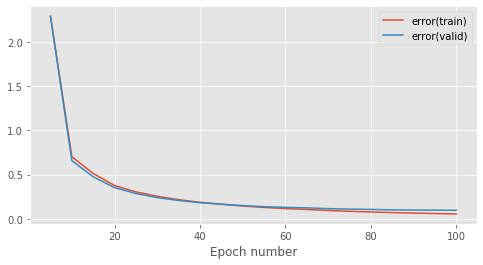

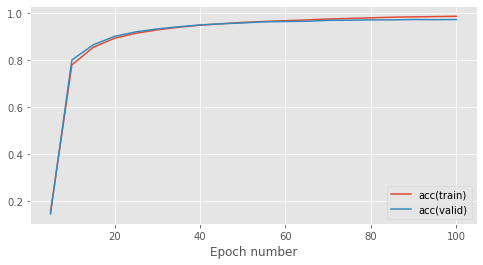

    final error(train) = 5.56e-02
    final error(valid) = 9.65e-02
    final acc(train)   = 9.86e-01
    final acc(valid)   = 9.72e-01
    run time per epoch = 8.06


In [37]:
reproducable_exp_deeper(100, 100, 0.01, 0.01, 300) #Same parameters as the first experiment,with a deeper network

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:  32%|████████████████████▏                                          | 160/500 [00:00<00:01, 255.50it/s]


Epoch Progress:  73%|██████████████████████████████████████████████▏                | 367/500 [00:01<00:00, 249.26it/s]


Epoch Progress:  40%|████████████████████████▉                                      | 198/500 [00:00<00:01, 266.93it/s]


Epoch Progress:   6%|███▊                                                            | 30/500 [00:00<00:01, 294.27it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 314.05it/s]


Epoch Progress:  47%|█████████████████████████████▋                                 | 236/500 [00:00<00:00, 328.46it/s]


Epoch Progress:  13%|████████▍                                                       | 66/500 [00:00<00:01, 314.05it/s]


Epoch Progress:  93%|██████████████████████████████████████████████████████████▎    | 463/500 [00:01<00:00, 336.38it/s]


Experiment Progress:  64%|██████████████████████████████████████▍                     | 64/100 [02:07<01:09,  1.94s/it]


Epoch Progress:  34%|█████████████████████▏                                         | 168/500 [00:00<00:01, 327.09it/s]


Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress:  67%|██████████████████████████████████████████                     | 334/500 [00:01<00:00, 308.02it/s]


Epoch Progress:   6%|███▉                                                            | 31/500 [00:00<00:01, 304.09it/s]


Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [03:15<00:00,  1.96s/it]


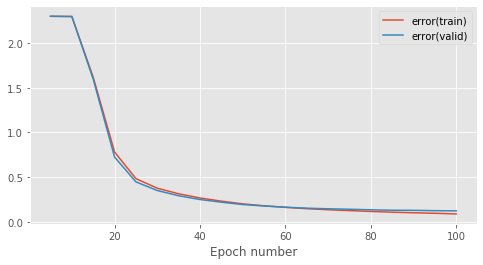

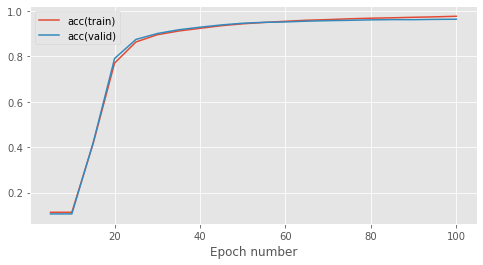

    final error(train) = 8.76e-02
    final error(valid) = 1.21e-01
    final acc(train)   = 9.76e-01
    final acc(valid)   = 9.63e-01
    run time per epoch = 1.97


In [38]:
reproducable_exp_deeper(100, 100, 0.01, 0.01, 64) #Same parameters as the first experiment,with a deeper network

Below is a summary of the experiments we've made.
Simple architecture implies Affine, Relu, Affine. Deeper architecture implies Affine, Relu, Affine, Relu, Affine.

Based on the table below, we can conclude that increasing the learning rate is the key factor that reduces the likelihood we'll overfit the model given 100 epochs. This makes sense considering a smaller rearning rate will slow down the learning process. Increasing the number of hiden units in both architecures seems to improve the accuracy. Similarly, decreasing the number of hidden units in both architectures decreases the accuracy. Evidently, increasing the number of hidden units increases the runtime per epoch drastically, while decreasing it decreases the runtime per epoch. By comparing the 100 hidden units simple and deeper architecture, we can conclude that the deeper architecture does not offer any significant improvements in accuracy, and further increases the training time.

Note, that we're not changing the number of training epochs as per the constraint of the task. If this was a parameter that we could tweak as well, we could do early stopping of the training in the situations where it was necessary.

In the next tasks, we're going to use the model in the third row, described [batch_size = 100, num_epochs=100, learning_rate = 0.01, init_scales=0.01, hidden_units = 100].

<table style="width:100%">
  <tr>
    <th>Architecture</th>
    <th>batch_size</th>
    <th>num_epochs</th>
    <th>learning_rate</th>
    <th>init_scales</th>
    <th>hidden_units</th>
    <th>runtime per epoch</th>
    <th>Overfitting</th>
	<th>Validation Accuracy </th>
  </tr>
  <tr>
    <th>Simple</th>
    <th>100</th>
    <th>100</th>
    <th>0.2</th>
    <th>0.1</th>
    <th>100</th>
    <th>2.15</th>
    <th>Yes</th>
	<th>1</th>
  </tr>
   <tr>
    <th>Simple</th>
    <th>100</th>
    <th>100</th>
    <th>0.2</th>
    <th>0.01</th>
    <th>100</th>
    <th>2.03</th>
    <th>Yes</th>
	<th> 0.979 </th>
  </tr>
  <tr>
    <th>Simple</th>
    <th>100</th>
    <th>100</th>
    <th>0.01</th>
    <th>0.01</th>
    <th>100</th>
    <th>1.92</th>
    <th>No</th>
	<th> 0.966 </th>
  </tr>
<tr>
    <th>Simple</th>
    <th>32</th>
    <th>100</th>
    <th>0.01</th>
    <th>0.01</th>
    <th>100</th>
    <th>3.02</th>
    <th>Yes</th>
	<th>0.97 </th>
  </tr><tr>
    <th>Simple</th>
    <th>100</th>
    <th>100</th>
    <th>0.01</th>
    <th>0.01</th>
    <th>300</th>
    <th>5.63</th>
    <th>No</th>
	<th>0.968 </th>
  </tr><tr>
    <th>Simple</th>
    <th>100</th>
    <th>100</th>
    <th>0.01</th>
    <th>0.01</th>
    <th>64</th>
    <th>1.54</th>
    <th>No</th>
	<th>0.963 </th>
  </tr><tr>
    <th>Deeper</th>
    <th>100</th>
    <th>100</th>
    <th>0.2</th>
    <th>0.1</th>
    <th>100</th>
    <th>2.41</th>
    <th>Yes</th>
	<th>0.978 </th>
  </tr><tr>
    <th>Deeper</th>
    <th>100</th>
    <th>100</th>
    <th>0.2</th>
    <th>0.01</th>
    <th>100</th>
    <th>2.7</th>
    <th>Yes</th>
	<th>0.979 </th>
  </tr><tr>
    <th>Deeper</th>
    <th>100</th>
    <th>100</th>
    <th>0.01</th>
    <th>0.01</th>
    <th>100</th>
    <th>2.46</th>
    <th>No</th>
	<th>0.968 </th>
  </tr><tr>
    <th>Deeper</th>
    <th>32</th>
    <th>100</th>
    <th>0.01</th>
    <th>0.01</th>
    <th>100</th>
    <th>5.15</th>
    <th>Yes</th>
	<th>0.974</th>
  </tr><tr>
    <th>Deeper</th>
    <th>100</th>
    <th>100</th>
    <th>0.01</th>
    <th>0.01</th>
    <th>300</th>
    <th>8.06</th>
    <th>No</th>
	<th>0.972</th>
  </tr>
  </tr><tr>
    <th>Deeper</th>
    <th>100</th>
    <th>100</th>
    <th>0.01</th>
    <th>0.01</th>
    <th>64</th>
    <th>1.97</th>
    <th>No</th>
	<th>0.963</th>
  </tr>
</table>

<h3> Task 1-3 </h3>

As mentioned above, we're going to use a baseline model with the following parameters:  [batch_size = 100, num_epochs=100, learning_rate = 0.01, init_scales=0.01, hidden_units = 100]. Based on this, we're going to perform 4 experiments, by changing the activation functions as described in Task 1-1.

We'll define the following experiments:
<ul>
  <li>Baseline model with ELU(alpha=1)</li>
  <li>Baseline model with ELU(alpha=0.1)</li>
  <li>Bseline model with SELU</li>
    <li>Baseline model with GELU</li>
  <li>Baseline model with ISRLU (alpha=1)</li>
  <li>Baseline model with ISRLU (alpha=0.1)</li>
</ul>


We're using alpha=1 and alpha=0.1 following the example of the [original authors](https://openreview.net/pdf?id=HkMCybx0-)

In [4]:
def experiment_elu(alpha):
    # Set training run hyperparameters
    batch_size = 100  # number of data points in a batch
    num_epochs = 100  # number of training epochs to perform
    stats_interval = 5  # epoch interval between recording and printing stats
    learning_rate = 0.01  # learning rate for gradient descent

    init_scales = [0.01]  # scale for random parameter initialisation
    final_errors_train = []
    final_errors_valid = []
    final_accs_train = []
    final_accs_valid = []

    for init_scale in init_scales:

        print('-' * 80)
        print(f'learning_rate={learning_rate} init_scale={init_scale}')
        print('-' * 80)
        # Reset random number generator and data provider states on each run
        # to ensure reproducibility of results
        rng.seed(seed)
        train_data.reset()
        valid_data.reset()

        # Alter data-provider batch size
        train_data.batch_size = batch_size 
        valid_data.batch_size = batch_size

        # Create a parameter initialiser which will sample random uniform values
        # from [-init_scale, init_scale]
        param_init = UniformInit(-init_scale, init_scale, rng=rng)

        # Create a model with two affine layers
        hidden_dim = 100 #hidden units
        model = MultipleLayerModel([
            AffineLayer(input_dim, hidden_dim, param_init, param_init),
            ELULayer(alpha=1),
            AffineLayer(hidden_dim, output_dim, param_init, param_init)
        ])

        # Initialise a cross entropy error object
        error = CrossEntropySoftmaxError()

        # Use a basic gradient descent learning rule
        learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

        stats, keys, run_time, fig_1, ax_1, fig_2, ax_2 = train_model_and_plot_stats(
            model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval)
        plt.show()

        print(f'    final error(train) = {stats[-1, keys["error(train)"]]:.2e}')
        print(f'    final error(valid) = {stats[-1, keys["error(valid)"]]:.2e}')
        print(f'    final acc(train)   = {stats[-1, keys["acc(train)"]]:.2e}')
        print(f'    final acc(valid)   = {stats[-1, keys["acc(valid)"]]:.2e}')
        print(f'    run time per epoch = {run_time * 1. / num_epochs:.2f}')

        final_errors_train.append(stats[-1, keys['error(train)']])
        final_errors_valid.append(stats[-1, keys['error(valid)']])
        final_accs_train.append(stats[-1, keys['acc(train)']])
        final_accs_valid.append(stats[-1, keys['acc(valid)']])

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:  73%|█████████████████████████████████████████████▉                 | 365/500 [00:01<00:00, 222.66it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 235.43it/s]
Epoch 5: 2.2s to complete
    error(train)=2.13e+00, acc(train)=2.04e-01, error(valid)=2.13e+00, acc(valid)=2.04e-01
Epoch Progress:  67%|██████████████████████████████████████████▏                    | 335/500 [00:01<00:00, 269.44it/s]


Epoch Progress:  85%|█████████████████████████████████████████████████████▌         | 425/500 [00:01<00:00, 233.63it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 238.12it/s]
Epoch 10: 2.1s to complete
    error(train)=2.11e+00, acc(train)=2.01e-01, error(valid)=2.10e+00, acc(valid)=2.01e-01
Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 244.64it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 263.59it/s]
Epoch 15: 1.9s to complete
    error(train)=2.15e+00, acc(train)=2.15e-01, error(valid)=2.14e+00, acc(valid)=2.21e-01
Epoch Progress:  10%|██████▌                                                         | 51/500 [00:00<00:01, 248.81it/s]


Epoch Progress:  25%|████████████████                                               | 127/500 [00:00<00:01, 247.21it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 109.09it/s]
Epoch 20: 4.6s to complete
    error(train)=2.18e+00, acc(train)=2.37e-01, error(valid)=2.17e+00, acc(valid)=2.42e-01
Epoch Progress:  21%|█████████████▍                                                 | 107/500 [00:00<00:02, 132.13it/s]


Experiment Progress:  23%|█████████████▊                                              | 23/100 [00:57<03:42,  2.88s/it]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 224.04it/s]
Epoch 25: 2.3s to complete
    error(train)=2.20e+00, acc(train)=2.76e-01, error(valid)=2.19e+00, acc(valid)=2.80e-01
Epoch Progress:  84%|████████████████████████████████████████████████████▋          | 418/500 [00:01<00:00, 236.04it/s]


Epoch Progress:  72%|█████████████████████████████████████████████                  | 358/500 [00:01<00:00, 231.37it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 223.34it/s]
Epoch 30: 2.3s to complete
    error(train)=2.19e+00, acc(train)=3.18e-01, error(valid)=2.18e+00, acc(valid)=3.41e-01
Epoch Progress:  46%|█████████████████████████████▏                                 | 232/500 [00:01<00:01, 237.09it/s]


Epoch Progress:  30%|██████████████████▉                                            | 150/500 [00:00<00:01, 245.85it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 227.20it/s]
Epoch 35: 2.2s to complete
    error(train)=2.18e+00, acc(train)=2.21e-01, error(valid)=2.17e+00, acc(valid)=2.35e-01
Epoch Progress:  21%|████████████▉                                                  | 103/500 [00:00<00:01, 246.54it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 225.66it/s]
Epoch 40: 2.2s to complete
    error(train)=2.19e+00, acc(train)=2.57e-01, error(valid)=2.18e+00, acc(valid)=2.64e-01
Epoch Progress:  10%|██████▏                                                         | 48/500 [00:00<00:01, 232.15it/s]


Epoch Progress:  10%|██████▍                                                         | 50/500 [00:00<00:01, 227.84it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 231.29it/s]
Epoch 45: 2.2s to complete
    error(train)=2.22e+00, acc(train)=2.10e-01, error(valid)=2.21e+00, acc(valid)=2.26e-01
  0%|                                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress:  93%|██████████████████████████████████████████████████████████▌    | 465/500 [00:01<00:00, 244.45it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 180.09it/s]
Epoch 50: 2.8s to complete
    error(train)=2.21e+00, acc(train)=2.31e-01, error(valid)=2.21e+00, acc(valid)=2.46e-01
Epoch Progress:  72%|█████████████████████████████████████████████                  | 358/500 [00:01<00:00, 283.68it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 263.73it/s]
Epoch 55: 1.9s to complete
    error(train)=2.24e+00, acc(train)=1.85e-01, error(valid)=2.24e+00, acc(valid)=1.94e-01


Epoch Progress:  11%|██████▊                                                         | 53/500 [00:00<00:01, 259.72it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 259.62it/s]
Epoch 60: 1.9s to complete
    error(train)=2.24e+00, acc(train)=1.81e-01, error(valid)=2.24e+00, acc(valid)=1.80e-01
Epoch Progress:  39%|████████████████████████▌                                      | 195/500 [00:00<00:01, 275.21it/s]


Epoch Progress:  72%|█████████████████████████████████████████████▍                 | 361/500 [00:01<00:00, 278.52it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 258.28it/s]
Epoch 65: 2.0s to complete
    error(train)=2.24e+00, acc(train)=1.82e-01, error(valid)=2.24e+00, acc(valid)=1.82e-01
Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 256.03it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 232.48it/s]
Epoch 70: 2.2s to complete
    error(train)=2.25e+00, acc(train)=1.61e-01, error(valid)=2.25e+00, acc(valid)=1.70e-01
Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress:   4%|██▊                                                             | 22/500 [00:00<00:02, 215.81it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 261.11it/s]
Epoch 75: 1.9s to complete
    error(train)=2.25e+00, acc(train)=1.65e-01, error(valid)=2.25e+00, acc(valid)=1.61e-01
Epoch Progress:  21%|█████████████▍                                                 | 107/500 [00:00<00:01, 255.83it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 254.86it/s]
Epoch 80: 2.0s to complete
    error(train)=2.26e+00, acc(train)=1.92e-01, error(valid)=2.25e+00, acc(valid)=1.91e-01
Epoch Progress:  33%|████████████████████▊                                          | 165/500 [00:00<00:01, 267.46it/s]


Epoch Progress:  67%|██████████████████████████████████████████                     | 334/500 [00:01<00:00, 278.12it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 257.61it/s]
Epoch 85: 2.0s to complete
    error(train)=2.26e+00, acc(train)=1.47e-01, error(valid)=2.26e+00, acc(valid)=1.53e-01
Epoch Progress:  91%|█████████████████████████████████████████████████████████▏     | 454/500 [00:01<00:00, 279.02it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 259.75it/s]
Epoch 90: 2.0s to complete
    error(train)=2.27e+00, acc(train)=1.55e-01, error(valid)=2.26e+00, acc(valid)=1.51e-01
Experiment Progress:  90%|██████████████████████████████████████████████████████      | 90/100 [03:31<00:23,  2.34s/it]


Epoch Progress:   4%|██▊                                                             | 22/500 [00:00<00:02, 215.81it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 238.01it/s]
Epoch 95: 2.1s to complete
    error(train)=2.27e+00, acc(train)=1.43e-01, error(valid)=2.27e+00, acc(valid)=1.52e-01
Epoch Progress:  16%|██████████▎                                                     | 81/500 [00:00<00:01, 251.84it/s]


Epoch Progress:  20%|████████████▋                                                   | 99/500 [00:00<00:01, 239.09it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 245.36it/s]
Epoch 100: 2.1s to complete
    error(train)=2.28e+00, acc(train)=1.70e-01, error(valid)=2.28e+00, acc(valid)=1.68e-01
Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [03:54<00:00,  2.34s/it]


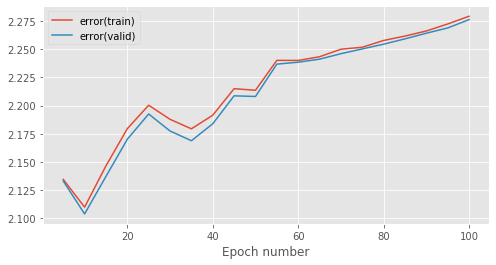

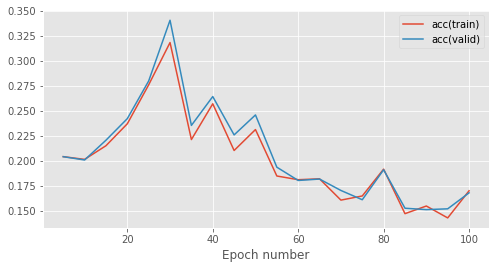

    final error(train) = 2.28e+00
    final error(valid) = 2.28e+00
    final acc(train)   = 1.70e-01
    final acc(valid)   = 1.68e-01
    run time per epoch = 2.35


In [5]:
experiment_elu(alpha=1)

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:  64%|████████████████████████████████████████▎                      | 320/500 [00:01<00:00, 209.55it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 228.03it/s]
Epoch 5: 2.2s to complete
    error(train)=2.13e+00, acc(train)=2.04e-01, error(valid)=2.13e+00, acc(valid)=2.04e-01
Epoch Progress:  34%|█████████████████████▋                                         | 172/500 [00:00<00:01, 242.11it/s]


Epoch Progress:  15%|█████████▎                                                      | 73/500 [00:00<00:02, 173.08it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 223.14it/s]
Epoch 10: 2.3s to complete
    error(train)=2.11e+00, acc(train)=2.01e-01, error(valid)=2.10e+00, acc(valid)=2.01e-01
Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 223.94it/s]


Experiment Progress:  14%|████████▍                                                   | 14/100 [00:34<03:13,  2.26s/it]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 242.50it/s]
Epoch 15: 2.1s to complete
    error(train)=2.15e+00, acc(train)=2.15e-01, error(valid)=2.14e+00, acc(valid)=2.21e-01
Epoch Progress:  93%|██████████████████████████████████████████████████████████▍    | 464/500 [00:01<00:00, 233.20it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 252.54it/s]
Epoch 20: 2.0s to complete
    error(train)=2.18e+00, acc(train)=2.37e-01, error(valid)=2.17e+00, acc(valid)=2.42e-01
Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Experiment Progress:  23%|█████████████▊                                              | 23/100 [00:54<02:56,  2.29s/it]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 222.45it/s]
Epoch 25: 2.3s to complete
    error(train)=2.20e+00, acc(train)=2.76e-01, error(valid)=2.19e+00, acc(valid)=2.80e-01
Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress:  20%|████████████▋                                                  | 101/500 [00:00<00:01, 234.34it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 242.39it/s]
Epoch 30: 2.1s to complete
    error(train)=2.19e+00, acc(train)=3.18e-01, error(valid)=2.18e+00, acc(valid)=3.41e-01
Epoch Progress:  38%|███████████████████████▋                                       | 188/500 [00:00<00:01, 266.16it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 257.48it/s]
Epoch 35: 2.0s to complete
    error(train)=2.18e+00, acc(train)=2.21e-01, error(valid)=2.17e+00, acc(valid)=2.35e-01
Epoch Progress:  61%|██████████████████████████████████████▍                        | 305/500 [00:01<00:00, 268.96it/s]


Epoch Progress:  14%|████████▊                                                       | 69/500 [00:00<00:03, 113.15it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 158.72it/s]
Epoch 40: 3.2s to complete
    error(train)=2.19e+00, acc(train)=2.57e-01, error(valid)=2.18e+00, acc(valid)=2.64e-01
Epoch Progress:  87%|██████████████████████████████████████████████████████▉        | 436/500 [00:01<00:00, 269.48it/s]


Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 260.43it/s]
Epoch 45: 1.9s to complete
    error(train)=2.22e+00, acc(train)=2.10e-01, error(valid)=2.21e+00, acc(valid)=2.26e-01
Epoch Progress:  19%|████████████▍                                                   | 97/500 [00:00<00:01, 235.66it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 229.59it/s]
Epoch 50: 2.2s to complete
    error(train)=2.21e+00, acc(train)=2.31e-01, error(valid)=2.21e+00, acc(valid)=2.46e-01
Epoch Progress:  11%|███████▎                                                        | 57/500 [00:00<00:03, 118.99it/s]


Epoch Progress:  91%|█████████████████████████████████████████████████████████▌     | 457/500 [00:01<00:00, 286.28it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 264.84it/s]
Epoch 55: 1.9s to complete
    error(train)=2.24e+00, acc(train)=1.85e-01, error(valid)=2.24e+00, acc(valid)=1.94e-01
Epoch Progress:   5%|███▏                                                            | 25/500 [00:00<00:01, 242.86it/s]


Epoch Progress:  39%|████████████████████████▋                                      | 196/500 [00:00<00:01, 274.38it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 261.66it/s]
Epoch 60: 1.9s to complete
    error(train)=2.24e+00, acc(train)=1.81e-01, error(valid)=2.24e+00, acc(valid)=1.80e-01
Epoch Progress:  72%|█████████████████████████████████████████████▎                 | 360/500 [00:01<00:00, 268.08it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 266.39it/s]
Epoch 65: 1.9s to complete
    error(train)=2.24e+00, acc(train)=1.82e-01, error(valid)=2.24e+00, acc(valid)=1.82e-01
Epoch Progress:  96%|████████████████████████████████████████████████████████████▏  | 478/500 [00:02<00:00, 150.46it/s]


Epoch Progress:  52%|█████████████████████████████████                              | 262/500 [00:01<00:01, 170.22it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 245.96it/s]
Epoch 70: 2.1s to complete
    error(train)=2.25e+00, acc(train)=1.61e-01, error(valid)=2.25e+00, acc(valid)=1.70e-01
Epoch Progress:  56%|███████████████████████████████████▌                           | 282/500 [00:01<00:00, 274.23it/s]


Epoch Progress:  19%|███████████▉                                                    | 93/500 [00:00<00:01, 217.90it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 199.79it/s]
Epoch 75: 2.5s to complete
    error(train)=2.25e+00, acc(train)=1.65e-01, error(valid)=2.25e+00, acc(valid)=1.61e-01
Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 253.82it/s]
Epoch 80: 2.0s to complete
    error(train)=2.26e+00, acc(train)=1.92e-01, error(valid)=2.25e+00, acc(valid)=1.91e-01
Epoch Progress:  21%|█████████████▎                                                 | 106/500 [00:00<00:01, 246.68it/s]


Epoch Progress:  45%|████████████████████████████                                   | 223/500 [00:00<00:01, 272.17it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 241.45it/s]
Epoch 85: 2.1s to complete
    error(train)=2.26e+00, acc(train)=1.47e-01, error(valid)=2.26e+00, acc(valid)=1.53e-01
Epoch Progress:  63%|███████████████████████████████████████▍                       | 313/500 [00:01<00:00, 269.36it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 260.97it/s]
Epoch 90: 1.9s to complete
    error(train)=2.27e+00, acc(train)=1.55e-01, error(valid)=2.26e+00, acc(valid)=1.51e-01


Epoch Progress:  11%|██████▊                                                         | 53/500 [00:00<00:01, 253.38it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 256.95it/s]
Epoch 95: 2.0s to complete
    error(train)=2.27e+00, acc(train)=1.43e-01, error(valid)=2.27e+00, acc(valid)=1.52e-01
Epoch Progress:  38%|███████████████████████▊                                       | 189/500 [00:00<00:01, 256.88it/s]


Epoch Progress:  68%|██████████████████████████████████████████▋                    | 339/500 [00:01<00:00, 275.06it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:01<00:00, 261.52it/s]
Epoch 100: 1.9s to complete
    error(train)=2.28e+00, acc(train)=1.70e-01, error(valid)=2.28e+00, acc(valid)=1.68e-01
Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [03:53<00:00,  2.33s/it]


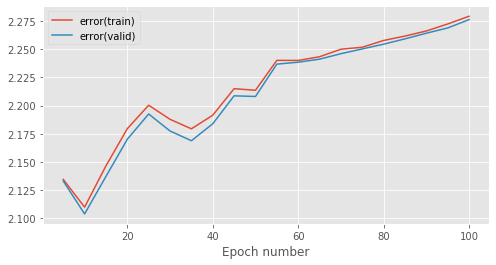

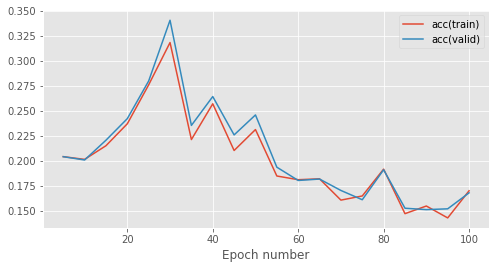

    final error(train) = 2.28e+00
    final error(valid) = 2.28e+00
    final acc(train)   = 1.70e-01
    final acc(valid)   = 1.68e-01
    run time per epoch = 2.34


In [6]:
experiment_elu(alpha=0.1)

The result above seems very irregular and indicates that with more training, the accuracy decreases. This leads us to speculate that this is likely due to the fact that the derivative of ELU contains an exponential function. Thus, using a stochastic gradient descent, errors grow exponentially high and the network ends up diverging from the solution.

Next, we're going to look into SELU.

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:  11%|███████                                                         | 55/500 [00:00<00:02, 163.79it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 179.82it/s]
Epoch 5: 2.8s to complete
    error(train)=4.35e-01, acc(train)=8.85e-01, error(valid)=4.03e-01, acc(valid)=8.94e-01
Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 195.75it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 234.92it/s]
Epoch 10: 2.2s to complete
    error(train)=3.31e-01, acc(train)=9.07e-01, error(valid)=3.07e-01, acc(valid)=9.14e-01
Epoch Progress:  80%|██████████████████████████████████████████████████▋            | 402/500 [00:02<00:00, 173.03it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 192.21it/s]
Epoch 15: 2.6s to complete
    error(train)=2.95e-01, acc(train)=9.15e-01, error(valid)=2.77e-01, acc(valid)=9.20e-01
Epoch Progress:  54%|█████████████████████████████████▊                             | 268/500 [00:01<00:01, 201.87it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 171.96it/s]
Epoch 20: 2.9s to complete
    error(train)=2.73e-01, acc(train)=9.23e-01, error(valid)=2.59e-01, acc(valid)=9.24e-01
Epoch Progress:  32%|████████████████████▎                                          | 161/500 [00:00<00:01, 196.04it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 189.82it/s]
Epoch 25: 2.7s to complete
    error(train)=2.56e-01, acc(train)=9.28e-01, error(valid)=2.44e-01, acc(valid)=9.28e-01
Epoch Progress:  27%|████████████████▉                                              | 134/500 [00:00<00:01, 187.94it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 194.10it/s]
Epoch 30: 2.6s to complete
    error(train)=2.41e-01, acc(train)=9.32e-01, error(valid)=2.32e-01, acc(valid)=9.33e-01
Epoch Progress:  65%|█████████████████████████████████████████▏                     | 327/500 [00:01<00:00, 224.58it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 205.75it/s]
Epoch 35: 2.5s to complete
    error(train)=2.29e-01, acc(train)=9.35e-01, error(valid)=2.21e-01, acc(valid)=9.38e-01
  0%|                                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 210.33it/s]
Epoch 40: 2.4s to complete
    error(train)=2.17e-01, acc(train)=9.38e-01, error(valid)=2.14e-01, acc(valid)=9.40e-01
Epoch Progress:  40%|█████████████████████████▍                                     | 202/500 [00:00<00:01, 224.26it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 212.65it/s]
Epoch 45: 2.4s to complete
    error(train)=2.06e-01, acc(train)=9.42e-01, error(valid)=2.05e-01, acc(valid)=9.43e-01
Epoch Progress:  65%|████████████████████████████████████████▊                      | 324/500 [00:01<00:00, 225.20it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 203.70it/s]
Epoch 50: 2.5s to complete
    error(train)=1.97e-01, acc(train)=9.43e-01, error(valid)=1.98e-01, acc(valid)=9.46e-01
Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 211.61it/s]
Epoch 55: 2.4s to complete
    error(train)=1.86e-01, acc(train)=9.47e-01, error(valid)=1.88e-01, acc(valid)=9.49e-01
  0%|                                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 213.98it/s]
Epoch 60: 2.4s to complete
    error(train)=1.78e-01, acc(train)=9.49e-01, error(valid)=1.82e-01, acc(valid)=9.53e-01
Epoch Progress:  49%|██████████████████████████████▉                                | 246/500 [00:01<00:01, 220.35it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 200.51it/s]
Epoch 65: 2.5s to complete
    error(train)=1.68e-01, acc(train)=9.52e-01, error(valid)=1.73e-01, acc(valid)=9.53e-01
Epoch Progress:  82%|███████████████████████████████████████████████████▊           | 411/500 [00:01<00:00, 220.29it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 213.11it/s]
Epoch 70: 2.4s to complete
    error(train)=1.59e-01, acc(train)=9.55e-01, error(valid)=1.67e-01, acc(valid)=9.56e-01
Epoch Progress:  17%|███████████▏                                                    | 87/500 [00:00<00:02, 199.34it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 213.18it/s]
Epoch 75: 2.4s to complete
    error(train)=1.53e-01, acc(train)=9.57e-01, error(valid)=1.61e-01, acc(valid)=9.56e-01
Epoch Progress:  50%|███████████████████████████████▏                               | 248/500 [00:01<00:01, 196.03it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 184.71it/s]
Epoch 80: 2.7s to complete
    error(train)=1.47e-01, acc(train)=9.59e-01, error(valid)=1.56e-01, acc(valid)=9.59e-01
Epoch Progress:  48%|██████████████████████████████                                 | 239/500 [00:01<00:01, 202.70it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 189.40it/s]
Epoch 85: 2.7s to complete
    error(train)=1.39e-01, acc(train)=9.60e-01, error(valid)=1.49e-01, acc(valid)=9.60e-01
Epoch Progress:  50%|███████████████████████████████▊                               | 252/500 [00:01<00:01, 211.02it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 164.07it/s]
Epoch 90: 3.1s to complete
    error(train)=1.35e-01, acc(train)=9.61e-01, error(valid)=1.48e-01, acc(valid)=9.60e-01
Epoch Progress:  22%|██████████████                                                 | 112/500 [00:00<00:01, 211.07it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 201.30it/s]
Epoch 95: 2.5s to complete
    error(train)=1.31e-01, acc(train)=9.62e-01, error(valid)=1.44e-01, acc(valid)=9.61e-01
Epoch Progress:   5%|███▏                                                            | 25/500 [00:00<00:01, 240.52it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 247.12it/s]
Epoch 100: 2.0s to complete
    error(train)=1.27e-01, acc(train)=9.63e-01, error(valid)=1.43e-01, acc(valid)=9.61e-01


Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [04:40<00:00,  2.80s/it]


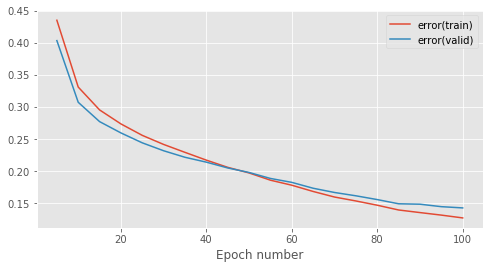

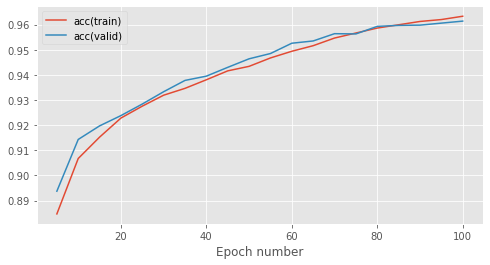

    final error(train) = 1.27e-01
    final error(valid) = 1.43e-01
    final acc(train)   = 9.63e-01
    final acc(valid)   = 9.61e-01
    run time per epoch = 2.81


In [11]:
 # Set training run hyperparameters
batch_size = 100  # number of data points in a batch
num_epochs = 100  # number of training epochs to perform
stats_interval = 5  # epoch interval between recording and printing stats
learning_rate = 0.01  # learning rate for gradient descent

init_scales = [0.01]  # scale for random parameter initialisation
final_errors_train = []
final_errors_valid = []
final_accs_train = []
final_accs_valid = []

for init_scale in init_scales:
    print('-' * 80)
    print(f'learning_rate={learning_rate} init_scale={init_scale}')
    print('-' * 80)
    # Reset random number generator and data provider states on each run
    # to ensure reproducibility of results
    rng.seed(seed)
    train_data.reset()
    valid_data.reset()

    # Alter data-provider batch size
    train_data.batch_size = batch_size 
    valid_data.batch_size = batch_size

    # Create a parameter initialiser which will sample random uniform values
    # from [-init_scale, init_scale]
    param_init = UniformInit(-init_scale, init_scale, rng=rng)

    # Create a model with two affine layers
    hidden_dim = 100 #hidden units
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, param_init, param_init),
        SELULayer(),
        AffineLayer(hidden_dim, output_dim, param_init, param_init)
    ])

        # Initialise a cross entropy error object
    error = CrossEntropySoftmaxError()

    # Use a basic gradient descent learning rule
    learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

    stats, keys, run_time, fig_1, ax_1, fig_2, ax_2 = train_model_and_plot_stats(
            model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval)
    plt.show()

    print(f'    final error(train) = {stats[-1, keys["error(train)"]]:.2e}')
    print(f'    final error(valid) = {stats[-1, keys["error(valid)"]]:.2e}')
    print(f'    final acc(train)   = {stats[-1, keys["acc(train)"]]:.2e}')
    print(f'    final acc(valid)   = {stats[-1, keys["acc(valid)"]]:.2e}')
    print(f'    run time per epoch = {run_time * 1. / num_epochs:.2f}')

    final_errors_train.append(stats[-1, keys['error(train)']])
    final_errors_valid.append(stats[-1, keys['error(valid)']])
    final_accs_train.append(stats[-1, keys['acc(train)']])
    final_accs_valid.append(stats[-1, keys['acc(valid)']])

The model is not overfitting, however the accuracy achieved is lower than the baseline model which has RELU as an activation function.
Next, we're going to examine GELU.

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:  37%|███████████████████████▌                                       | 187/500 [00:01<00:02, 148.54it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 151.56it/s]
Epoch 5: 3.3s to complete
    error(train)=5.48e-01, acc(train)=8.52e-01, error(valid)=5.11e-01, acc(valid)=8.67e-01
Epoch Progress:  20%|████████████▊                                                  | 102/500 [00:00<00:02, 141.30it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 123.42it/s]
Epoch 10: 4.1s to complete
    error(train)=3.68e-01, acc(train)=8.96e-01, error(valid)=3.40e-01, acc(valid)=9.05e-01
Epoch Progress:  90%|████████████████████████████████████████████████████████▊      | 451/500 [00:03<00:00, 141.81it/s]


Epoch Progress:  40%|████████████████████████▉                                      | 198/500 [00:01<00:02, 128.97it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 136.81it/s]
Epoch 15: 3.7s to complete
    error(train)=3.22e-01, acc(train)=9.08e-01, error(valid)=2.99e-01, acc(valid)=9.15e-01
  0%|                                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 137.82it/s]
Epoch 20: 3.6s to complete
    error(train)=2.98e-01, acc(train)=9.15e-01, error(valid)=2.79e-01, acc(valid)=9.19e-01
Epoch Progress:  64%|████████████████████████████████████████▎                      | 320/500 [00:02<00:01, 135.00it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 111.05it/s]
Epoch 25: 4.5s to complete
    error(train)=2.82e-01, acc(train)=9.20e-01, error(valid)=2.65e-01, acc(valid)=9.23e-01
Epoch Progress:   6%|███▋                                                            | 29/500 [00:00<00:03, 139.97it/s]


Epoch Progress:  72%|█████████████████████████████████████████████▍                 | 361/500 [00:02<00:00, 150.26it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 139.74it/s]
Epoch 30: 3.6s to complete
    error(train)=2.69e-01, acc(train)=9.24e-01, error(valid)=2.54e-01, acc(valid)=9.26e-01
Epoch Progress:  61%|██████████████████████████████████████▏                        | 303/500 [00:01<00:01, 151.77it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 143.46it/s]
Epoch 35: 3.5s to complete
    error(train)=2.56e-01, acc(train)=9.27e-01, error(valid)=2.44e-01, acc(valid)=9.31e-01
Epoch Progress:  44%|███████████████████████████▉                                   | 222/500 [00:01<00:01, 148.33it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 120.08it/s]
Epoch 40: 4.2s to complete
    error(train)=2.44e-01, acc(train)=9.31e-01, error(valid)=2.34e-01, acc(valid)=9.34e-01
Epoch Progress:   3%|██                                                              | 16/500 [00:00<00:03, 155.43it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 149.01it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 151.35it/s]
Epoch 45: 3.3s to complete
    error(train)=2.32e-01, acc(train)=9.35e-01, error(valid)=2.24e-01, acc(valid)=9.37e-01
Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 154.35it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 142.53it/s]
Epoch 50: 3.5s to complete
    error(train)=2.21e-01, acc(train)=9.38e-01, error(valid)=2.15e-01, acc(valid)=9.41e-01
Epoch Progress:  61%|██████████████████████████████████████▎                        | 304/500 [00:02<00:01, 147.55it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 144.29it/s]
Epoch 55: 3.5s to complete
    error(train)=2.10e-01, acc(train)=9.41e-01, error(valid)=2.06e-01, acc(valid)=9.44e-01
Epoch Progress:  39%|████████████████████████▋                                      | 196/500 [00:01<00:02, 131.72it/s]


Epoch Progress:  12%|███████▉                                                        | 62/500 [00:00<00:02, 147.70it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 150.04it/s]
Epoch 60: 3.4s to complete
    error(train)=2.01e-01, acc(train)=9.44e-01, error(valid)=1.99e-01, acc(valid)=9.47e-01
Epoch Progress:  84%|████████████████████████████████████████████████████▉          | 420/500 [00:02<00:00, 139.31it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 145.48it/s]
Epoch 65: 3.5s to complete
    error(train)=1.92e-01, acc(train)=9.46e-01, error(valid)=1.92e-01, acc(valid)=9.46e-01
Epoch Progress:  69%|███████████████████████████████████████████▏                   | 343/500 [00:02<00:01, 151.13it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 152.63it/s]
Epoch 70: 3.3s to complete
    error(train)=1.83e-01, acc(train)=9.49e-01, error(valid)=1.84e-01, acc(valid)=9.51e-01
Epoch Progress:  57%|███████████████████████████████████▉                           | 285/500 [00:01<00:01, 156.04it/s]


Epoch Progress:  42%|██████████████████████████▍                                    | 210/500 [00:01<00:01, 155.06it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 151.55it/s]
Epoch 75: 3.3s to complete
    error(train)=1.75e-01, acc(train)=9.51e-01, error(valid)=1.77e-01, acc(valid)=9.52e-01
Epoch Progress:  26%|████████████████▍                                              | 130/500 [00:00<00:02, 158.66it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 154.29it/s]
Epoch 80: 3.3s to complete
    error(train)=1.68e-01, acc(train)=9.53e-01, error(valid)=1.71e-01, acc(valid)=9.55e-01
Epoch Progress:  23%|██████████████▏                                                | 113/500 [00:00<00:02, 156.20it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 152.07it/s]
Epoch 85: 3.3s to complete
    error(train)=1.60e-01, acc(train)=9.55e-01, error(valid)=1.65e-01, acc(valid)=9.56e-01
Epoch Progress:  20%|████████████▌                                                   | 98/500 [00:00<00:02, 154.72it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 147.12it/s]
Epoch 90: 3.4s to complete
    error(train)=1.54e-01, acc(train)=9.57e-01, error(valid)=1.61e-01, acc(valid)=9.57e-01
Epoch Progress:   9%|█████▉                                                          | 46/500 [00:00<00:03, 140.78it/s]


Experiment Progress:  94%|████████████████████████████████████████████████████████▍   | 94/100 [06:07<00:21,  3.60s/it]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 150.49it/s]
Epoch 95: 3.4s to complete
    error(train)=1.49e-01, acc(train)=9.59e-01, error(valid)=1.57e-01, acc(valid)=9.57e-01
Epoch Progress:  61%|██████████████████████████████████████▎                        | 304/500 [00:02<00:01, 120.00it/s]


Epoch Progress: 100%|████████████████████████████████████████████████████████████████| 500/500 [00:06<00:00, 79.92it/s]
Epoch 100: 6.3s to complete
    error(train)=1.43e-01, acc(train)=9.60e-01, error(valid)=1.52e-01, acc(valid)=9.58e-01
Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [06:36<00:00,  3.97s/it]


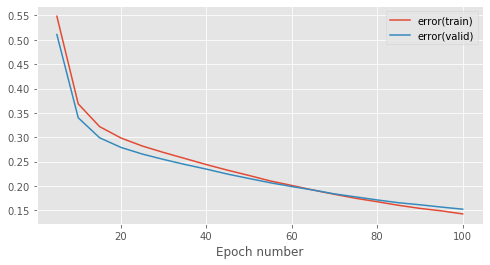

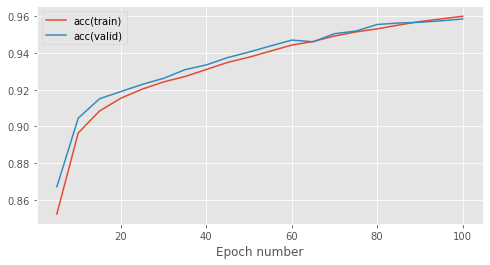

    final error(train) = 1.43e-01
    final error(valid) = 1.52e-01
    final acc(train)   = 9.60e-01
    final acc(valid)   = 9.58e-01
    run time per epoch = 3.98


In [12]:
 # Set training run hyperparameters
batch_size = 100  # number of data points in a batch
num_epochs = 100  # number of training epochs to perform
stats_interval = 5  # epoch interval between recording and printing stats
learning_rate = 0.01  # learning rate for gradient descent

init_scales = [0.01]  # scale for random parameter initialisation
final_errors_train = []
final_errors_valid = []
final_accs_train = []
final_accs_valid = []

for init_scale in init_scales:
    print('-' * 80)
    print(f'learning_rate={learning_rate} init_scale={init_scale}')
    print('-' * 80)
    # Reset random number generator and data provider states on each run
    # to ensure reproducibility of results
    rng.seed(seed)
    train_data.reset()
    valid_data.reset()

    # Alter data-provider batch size
    train_data.batch_size = batch_size 
    valid_data.batch_size = batch_size

    # Create a parameter initialiser which will sample random uniform values
    # from [-init_scale, init_scale]
    param_init = UniformInit(-init_scale, init_scale, rng=rng)

    # Create a model with two affine layers
    hidden_dim = 100 #hidden units
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, param_init, param_init),
        GELULayer(),
        AffineLayer(hidden_dim, output_dim, param_init, param_init)
    ])

        # Initialise a cross entropy error object
    error = CrossEntropySoftmaxError()

    # Use a basic gradient descent learning rule
    learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

    stats, keys, run_time, fig_1, ax_1, fig_2, ax_2 = train_model_and_plot_stats(
            model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval)
    plt.show()

    print(f'    final error(train) = {stats[-1, keys["error(train)"]]:.2e}')
    print(f'    final error(valid) = {stats[-1, keys["error(valid)"]]:.2e}')
    print(f'    final acc(train)   = {stats[-1, keys["acc(train)"]]:.2e}')
    print(f'    final acc(valid)   = {stats[-1, keys["acc(valid)"]]:.2e}')
    print(f'    run time per epoch = {run_time * 1. / num_epochs:.2f}')

    final_errors_train.append(stats[-1, keys['error(train)']])
    final_errors_valid.append(stats[-1, keys['error(valid)']])
    final_accs_train.append(stats[-1, keys['acc(train)']])
    final_accs_valid.append(stats[-1, keys['acc(valid)']])

Similar to using SELU, GELU does not overfit the model on 100 epochs, however it produces a lower validation accuracy than the baseline model. Following, we're going examine ISRLU with alpha=0.1 and alpha=1 and alpha=3.

In [8]:
def experiment_isrlu(alpha):
    # Set training run hyperparameters
    batch_size = 100  # number of data points in a batch
    num_epochs = 100  # number of training epochs to perform
    stats_interval = 5  # epoch interval between recording and printing stats
    learning_rate = 0.01  # learning rate for gradient descent

    init_scales = [0.01]  # scale for random parameter initialisation
    final_errors_train = []
    final_errors_valid = []
    final_accs_train = []
    final_accs_valid = []

    for init_scale in init_scales:

        print('-' * 80)
        print(f'learning_rate={learning_rate} init_scale={init_scale}')
        print('-' * 80)
        # Reset random number generator and data provider states on each run
        # to ensure reproducibility of results
        rng.seed(seed)
        train_data.reset()
        valid_data.reset()

        # Alter data-provider batch size
        train_data.batch_size = batch_size 
        valid_data.batch_size = batch_size

        # Create a parameter initialiser which will sample random uniform values
        # from [-init_scale, init_scale]
        param_init = UniformInit(-init_scale, init_scale, rng=rng)

        # Create a model with two affine layers
        hidden_dim = 100 #hidden units
        model = MultipleLayerModel([
            AffineLayer(input_dim, hidden_dim, param_init, param_init),
            ISRLULayer(alpha=alpha),
            AffineLayer(hidden_dim, output_dim, param_init, param_init)
        ])

        # Initialise a cross entropy error object
        error = CrossEntropySoftmaxError()

        # Use a basic gradient descent learning rule
        learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

        stats, keys, run_time, fig_1, ax_1, fig_2, ax_2 = train_model_and_plot_stats(
            model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval)
        plt.show()

        print(f'    final error(train) = {stats[-1, keys["error(train)"]]:.2e}')
        print(f'    final error(valid) = {stats[-1, keys["error(valid)"]]:.2e}')
        print(f'    final acc(train)   = {stats[-1, keys["acc(train)"]]:.2e}')
        print(f'    final acc(valid)   = {stats[-1, keys["acc(valid)"]]:.2e}')
        print(f'    run time per epoch = {run_time * 1. / num_epochs:.2f}')

        final_errors_train.append(stats[-1, keys['error(train)']])
        final_errors_valid.append(stats[-1, keys['error(valid)']])
        final_accs_train.append(stats[-1, keys['acc(train)']])
        final_accs_valid.append(stats[-1, keys['acc(valid)']])

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:  56%|███████████████████████████████████▎                           | 280/500 [00:01<00:00, 239.79it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 230.55it/s]
Epoch 5: 2.2s to complete
    error(train)=1.07e+00, acc(train)=6.74e-01, error(valid)=1.02e+00, acc(valid)=6.99e-01
Epoch Progress:  45%|████████████████████████████                                   | 223/500 [00:00<00:01, 241.39it/s]


Epoch Progress:  32%|████████████████████▏                                          | 160/500 [00:00<00:01, 222.46it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 218.66it/s]
Epoch 10: 2.3s to complete
    error(train)=7.76e-01, acc(train)=8.08e-01, error(valid)=7.15e-01, acc(valid)=8.29e-01
Epoch Progress:  14%|████████▉                                                       | 70/500 [00:00<00:01, 221.57it/s]


Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 223.84it/s]
Epoch 15: 2.3s to complete
    error(train)=7.43e-01, acc(train)=8.06e-01, error(valid)=6.79e-01, acc(valid)=8.30e-01
Experiment Progress:  17%|██████████▏                                                 | 17/100 [00:41<03:18,  2.39s/it]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 213.89it/s]
Epoch 20: 2.4s to complete
    error(train)=8.26e-01, acc(train)=8.28e-01, error(valid)=7.59e-01, acc(valid)=8.48e-01


Epoch Progress:  57%|████████████████████████████████████▏                          | 287/500 [00:01<00:00, 236.37it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 229.59it/s]
Epoch 25: 2.2s to complete
    error(train)=9.39e-01, acc(train)=7.94e-01, error(valid)=8.68e-01, acc(valid)=8.21e-01
Epoch Progress:  50%|███████████████████████████████▋                               | 251/500 [00:01<00:01, 182.87it/s]


Epoch Progress:  21%|████████████▉                                                  | 103/500 [00:00<00:02, 183.39it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 187.30it/s]
Epoch 30: 2.7s to complete
    error(train)=1.08e+00, acc(train)=7.39e-01, error(valid)=1.01e+00, acc(valid)=7.74e-01
Epoch Progress:  74%|██████████████████████████████████████████████▌                | 370/500 [00:01<00:00, 247.69it/s]


Epoch Progress:  71%|████████████████████████████████████████████▉                  | 357/500 [00:01<00:00, 251.06it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 216.67it/s]
Epoch 35: 2.3s to complete
    error(train)=1.18e+00, acc(train)=7.34e-01, error(valid)=1.11e+00, acc(valid)=7.66e-01
Epoch Progress:  34%|█████████████████████▎                                         | 169/500 [00:00<00:01, 237.88it/s]


Epoch Progress:  22%|█████████████▋                                                 | 109/500 [00:00<00:01, 211.24it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 210.82it/s]
Epoch 40: 2.4s to complete
    error(train)=1.22e+00, acc(train)=7.20e-01, error(valid)=1.15e+00, acc(valid)=7.57e-01
  0%|                                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress:  90%|████████████████████████████████████████████████████████▊      | 451/500 [00:01<00:00, 245.81it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 234.88it/s]
Epoch 45: 2.2s to complete
    error(train)=1.20e+00, acc(train)=7.26e-01, error(valid)=1.13e+00, acc(valid)=7.62e-01
Epoch Progress:  93%|██████████████████████████████████████████████████████████▍    | 464/500 [00:01<00:00, 253.81it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 144.17it/s]
Epoch 50: 3.5s to complete
    error(train)=1.23e+00, acc(train)=7.22e-01, error(valid)=1.15e+00, acc(valid)=7.58e-01
Epoch Progress:  39%|████████████████████████▊                                      | 197/500 [00:01<00:02, 136.10it/s]


Epoch Progress:   6%|███▌                                                            | 28/500 [00:00<00:03, 138.28it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 195.73it/s]
Epoch 55: 2.6s to complete
    error(train)=1.21e+00, acc(train)=6.94e-01, error(valid)=1.13e+00, acc(valid)=7.37e-01
Epoch Progress:  45%|████████████████████████████                                   | 223/500 [00:01<00:01, 228.04it/s]


Epoch Progress:  25%|███████████████▌                                               | 124/500 [00:00<00:01, 238.30it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 216.39it/s]
Epoch 60: 2.3s to complete
    error(train)=1.16e+00, acc(train)=7.53e-01, error(valid)=1.09e+00, acc(valid)=7.85e-01
Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 218.28it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 227.40it/s]
Epoch 65: 2.2s to complete
    error(train)=1.11e+00, acc(train)=7.64e-01, error(valid)=1.03e+00, acc(valid)=7.99e-01
Epoch Progress:  76%|███████████████████████████████████████████████▋               | 378/500 [00:01<00:00, 232.26it/s]


Epoch Progress:  51%|████████████████████████████████▏                              | 255/500 [00:01<00:01, 225.19it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 209.41it/s]
Epoch 70: 2.4s to complete
    error(train)=1.10e+00, acc(train)=7.61e-01, error(valid)=1.03e+00, acc(valid)=7.89e-01
Epoch Progress:  20%|████████████▌                                                   | 98/500 [00:00<00:01, 232.58it/s]


Epoch Progress:  91%|█████████████████████████████████████████████████████████▌     | 457/500 [00:02<00:00, 223.44it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 195.35it/s]
Epoch 75: 2.6s to complete
    error(train)=1.12e+00, acc(train)=7.24e-01, error(valid)=1.05e+00, acc(valid)=7.55e-01
Epoch Progress:  75%|███████████████████████████████████████████████▎               | 375/500 [00:01<00:00, 238.92it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 224.85it/s]
Epoch 80: 2.2s to complete
    error(train)=1.15e+00, acc(train)=7.00e-01, error(valid)=1.08e+00, acc(valid)=7.38e-01
Epoch Progress:  63%|███████████████████████████████████████▋                       | 315/500 [00:01<00:00, 230.75it/s]


Epoch Progress:  60%|█████████████████████████████████████▊                         | 300/500 [00:01<00:00, 241.07it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 223.74it/s]
Epoch 85: 2.3s to complete
    error(train)=1.21e+00, acc(train)=6.31e-01, error(valid)=1.15e+00, acc(valid)=6.69e-01
Epoch Progress:  38%|████████████████████████▏                                      | 192/500 [00:00<00:01, 232.78it/s]


Epoch Progress:  20%|████████████▌                                                   | 98/500 [00:00<00:01, 239.41it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 235.98it/s]
Epoch 90: 2.1s to complete
    error(train)=1.22e+00, acc(train)=7.19e-01, error(valid)=1.16e+00, acc(valid)=7.55e-01
Epoch Progress:   4%|██▌                                                             | 20/500 [00:00<00:02, 194.28it/s]


Epoch Progress:  90%|████████████████████████████████████████████████████████▊      | 451/500 [00:02<00:00, 216.16it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 201.08it/s]
Epoch 95: 2.5s to complete
    error(train)=1.28e+00, acc(train)=6.56e-01, error(valid)=1.23e+00, acc(valid)=7.00e-01
Epoch Progress:  82%|███████████████████████████████████████████████████▍           | 408/500 [00:01<00:00, 248.99it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 231.40it/s]
Epoch 100: 2.2s to complete
    error(train)=1.37e+00, acc(train)=6.24e-01, error(valid)=1.32e+00, acc(valid)=6.61e-01
Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [04:14<00:00,  2.55s/it]


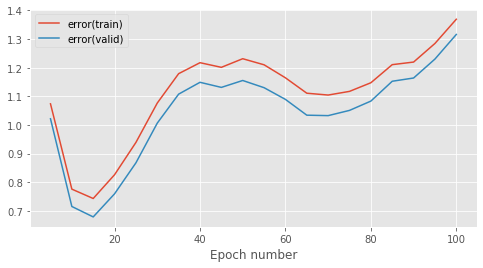

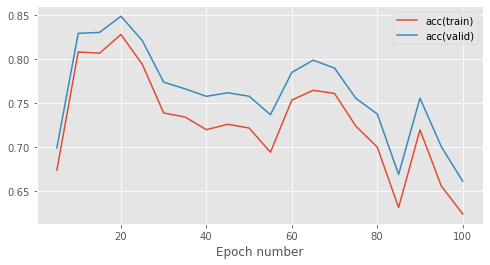

    final error(train) = 1.37e+00
    final error(valid) = 1.32e+00
    final acc(train)   = 6.24e-01
    final acc(valid)   = 6.61e-01
    run time per epoch = 2.56


In [9]:
experiment_isrlu(0.1)

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:  10%|██████▍                                                         | 50/500 [00:00<00:03, 117.36it/s]


Epoch Progress:  12%|███████▉                                                         | 61/500 [00:00<00:05, 83.45it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 177.14it/s]
Epoch 5: 2.9s to complete
    error(train)=2.17e+00, acc(train)=1.98e-01, error(valid)=2.17e+00, acc(valid)=1.97e-01
Epoch Progress:  61%|██████████████████████████████████████▋                        | 307/500 [00:01<00:00, 232.65it/s]


Epoch Progress:  48%|██████████████████████████████▏                                | 240/500 [00:01<00:01, 235.27it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 226.68it/s]
Epoch 10: 2.2s to complete
    error(train)=2.13e+00, acc(train)=1.98e-01, error(valid)=2.13e+00, acc(valid)=1.96e-01
Epoch Progress:  13%|████████▎                                                       | 65/500 [00:00<00:02, 205.41it/s]


Epoch Progress:  71%|████████████████████████████████████████████▊                  | 356/500 [00:01<00:00, 223.33it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 197.82it/s]
Epoch 15: 2.5s to complete
    error(train)=2.16e+00, acc(train)=2.07e-01, error(valid)=2.15e+00, acc(valid)=2.10e-01
Epoch Progress:  45%|████████████████████████████▎                                  | 225/500 [00:01<00:01, 224.55it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 224.34it/s]
Epoch 20: 2.3s to complete
    error(train)=2.18e+00, acc(train)=2.59e-01, error(valid)=2.18e+00, acc(valid)=2.65e-01
Epoch Progress:  24%|██████████████▉                                                | 119/500 [00:00<00:01, 231.23it/s]


Epoch Progress:   3%|█▋                                                              | 13/500 [00:00<00:03, 127.53it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 198.13it/s]
Epoch 25: 2.6s to complete
    error(train)=2.20e+00, acc(train)=3.03e-01, error(valid)=2.19e+00, acc(valid)=3.02e-01
Epoch Progress:  63%|███████████████████████████████████████▊                       | 316/500 [00:02<00:01, 119.48it/s]


Epoch Progress:  11%|███████▎                                                        | 57/500 [00:00<00:02, 175.90it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 187.65it/s]
Epoch 30: 2.7s to complete
    error(train)=2.21e+00, acc(train)=3.44e-01, error(valid)=2.20e+00, acc(valid)=3.60e-01
Epoch Progress:  68%|██████████████████████████████████████████▌                    | 338/500 [00:01<00:00, 202.65it/s]


Epoch Progress:  14%|████████▊                                                       | 69/500 [00:00<00:01, 220.48it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 196.42it/s]
Epoch 35: 2.6s to complete
    error(train)=2.19e+00, acc(train)=2.37e-01, error(valid)=2.19e+00, acc(valid)=2.47e-01
Epoch Progress:  70%|████████████████████████████████████████████▎                  | 352/500 [00:01<00:00, 201.11it/s]


Epoch Progress:  16%|█████████▉                                                      | 78/500 [00:00<00:02, 184.35it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 189.14it/s]
Epoch 40: 2.7s to complete
    error(train)=2.20e+00, acc(train)=2.80e-01, error(valid)=2.19e+00, acc(valid)=2.88e-01
Epoch Progress:  65%|████████████████████████████████████████▊                      | 324/500 [00:01<00:00, 191.21it/s]


Epoch Progress:   4%|██▊                                                             | 22/500 [00:00<00:02, 217.95it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 193.23it/s]
Epoch 45: 2.6s to complete
    error(train)=2.20e+00, acc(train)=2.48e-01, error(valid)=2.19e+00, acc(valid)=2.70e-01
Epoch Progress:  65%|████████████████████████████████████████▋                      | 323/500 [00:01<00:00, 192.09it/s]


Epoch Progress:   5%|███▎                                                            | 26/500 [00:00<00:03, 128.40it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 216.76it/s]
Epoch 50: 2.3s to complete
    error(train)=2.20e+00, acc(train)=2.99e-01, error(valid)=2.19e+00, acc(valid)=3.15e-01
Epoch Progress:  68%|██████████████████████████████████████████▌                    | 338/500 [00:01<00:00, 193.68it/s]


Epoch Progress:  11%|███████▏                                                        | 56/500 [00:00<00:02, 173.89it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 188.93it/s]
Epoch 55: 2.7s to complete
    error(train)=2.22e+00, acc(train)=2.84e-01, error(valid)=2.22e+00, acc(valid)=2.94e-01
Epoch Progress:  52%|████████████████████████████████▉                              | 261/500 [00:01<00:01, 201.82it/s]


  0%|                                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 161.33it/s]
Epoch 60: 3.1s to complete
    error(train)=2.22e+00, acc(train)=2.12e-01, error(valid)=2.22e+00, acc(valid)=2.14e-01
Epoch Progress:  35%|█████████████████████▊                                         | 173/500 [00:00<00:01, 184.27it/s]


Epoch Progress:   4%|██▋                                                             | 21/500 [00:00<00:02, 206.00it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 213.16it/s]
Epoch 65: 2.4s to complete
    error(train)=2.23e+00, acc(train)=2.11e-01, error(valid)=2.22e+00, acc(valid)=2.16e-01
Epoch Progress:  84%|█████████████████████████████████████████████████████          | 421/500 [00:01<00:00, 224.72it/s]


Epoch Progress:  60%|██████████████████████████████████████                         | 302/500 [00:01<00:00, 225.06it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 214.81it/s]
Epoch 70: 2.3s to complete
    error(train)=2.23e+00, acc(train)=2.42e-01, error(valid)=2.22e+00, acc(valid)=2.50e-01
Epoch Progress:  23%|██████████████▌                                                | 116/500 [00:00<00:02, 183.68it/s]


  0%|                                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 222.35it/s]
Epoch 75: 2.3s to complete
    error(train)=2.24e+00, acc(train)=1.83e-01, error(valid)=2.23e+00, acc(valid)=1.81e-01
Epoch Progress:  87%|██████████████████████████████████████████████████████▉        | 436/500 [00:01<00:00, 243.50it/s]


Epoch Progress:  65%|████████████████████████████████████████▉                      | 325/500 [00:01<00:00, 222.24it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 219.23it/s]
Epoch 80: 2.3s to complete
    error(train)=2.24e+00, acc(train)=2.53e-01, error(valid)=2.24e+00, acc(valid)=2.58e-01
Epoch Progress:  30%|███████████████████                                            | 151/500 [00:00<00:01, 213.77it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 220.00it/s]
Epoch 85: 2.3s to complete
    error(train)=2.24e+00, acc(train)=2.38e-01, error(valid)=2.24e+00, acc(valid)=2.48e-01
Epoch Progress:   5%|██▉                                                             | 23/500 [00:00<00:02, 227.86it/s]


Epoch Progress:  94%|███████████████████████████████████████████████████████████▏   | 470/500 [00:02<00:00, 232.66it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 214.81it/s]
Epoch 90: 2.4s to complete
    error(train)=2.25e+00, acc(train)=1.79e-01, error(valid)=2.25e+00, acc(valid)=1.80e-01
Epoch Progress:  67%|██████████████████████████████████████████                     | 334/500 [00:01<00:00, 232.97it/s]


Epoch Progress:  32%|████████████████████                                           | 159/500 [00:00<00:01, 201.36it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 205.96it/s]
Epoch 95: 2.5s to complete
    error(train)=2.26e+00, acc(train)=1.89e-01, error(valid)=2.25e+00, acc(valid)=2.04e-01
Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress:  94%|███████████████████████████████████████████████████████████▍   | 472/500 [00:02<00:00, 232.82it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 198.92it/s]
Epoch 100: 2.5s to complete
    error(train)=2.26e+00, acc(train)=2.34e-01, error(valid)=2.26e+00, acc(valid)=2.41e-01
Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [04:29<00:00,  2.70s/it]


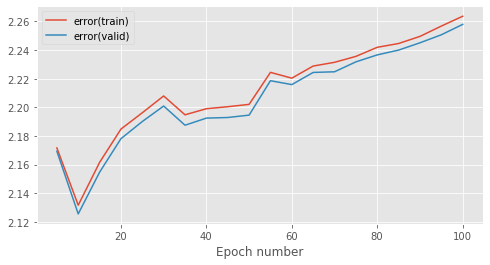

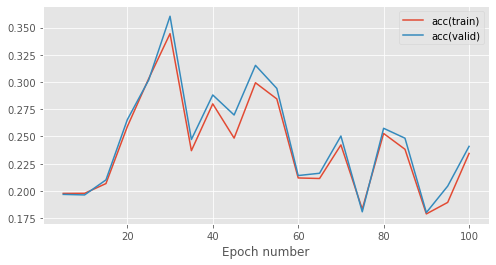

    final error(train) = 2.26e+00
    final error(valid) = 2.26e+00
    final acc(train)   = 2.34e-01
    final acc(valid)   = 2.41e-01
    run time per epoch = 2.71


In [10]:
experiment_isrlu(1)

ISRLU seems to have a similar problem as ELU. According to the [ISRLU paper](https://arxiv.org/pdf/1710.09967.pdf) The alpha parameter in the ISRLU function controls the value to which an ISRLU saturates for negative inputs. Thus different alphas may be differently sensitive. However they still do not change the function drastically enough to cause a significant change in the final accuracy.

Seeing as we expect that this may be a exploding gradient problem, employing techniques such as early stopping or regularisers may prove useful. Stopping the training at the initial peak accuracy may prove useful for both ELU and ISRLU with these present network configurations of the baseline model.

Regarding SELU and GELU, while it's entirely feasible to use these functions and for the performed experiment they offer a slightly lower accuracy and further produce a slower runtime per epoch. This may be due to the fact that computationally, both SELU and GELU are more costly in comparison to RELU.

<h3> Task 1-4 </h3>

Thus far, we have been using a uniform distribution to initialise the weights of our activation functions. This is supported by numerous authors, as an example, [He et al](https://arxiv.org/pdf/1502.01852.pdf) and [Mishra et al](https://www.aclweb.org/anthology/C18-1093.pdf). In the paper [All you need is a good init](http://cmp.felk.cvut.cz/~mishkdmy/papers/mishkin-iclr2016.pdf?fbclid=IwAR3dnFkVNx2Mof3O0XcNVI3mv5CRA2XEgftvMvnhDbsI9ZBNtusjhDFzG7A) the authors explore a variety of initialisation techniques with different activation functions. They suggest the initialisation using uniform distribution should be between 0.1-1 as these values lead to convergence. Values greater than 1 tend to cause divergence, and lower values than 0.1 tend to make it difficult for the network to leave its initial state. This is why in Task 1-2 we experimented only with values in the interval [0.1,1]


<h5> ELU </h5>

The [ELU paper](https://arxiv.org/pdf/1604.04112.pdf?fbclid=IwAR3eonnXiqNXgPGjVapT84adQii5DJ5nU4jeIEupf6aXDIrLYwVlDruQ_O4) suggests that the optimal initialisation for this function is following the example of [He et al](https://arxiv.org/pdf/1502.01852.pdf) . He et al remarks that the adjustments to the weights hold a certain variance. The authors expressed this variance as an expression, to minimise this variance. Thus, the adjustments to the weights are intended to be proportional with the ones in the previous steps, ultimately limiting the chance of vanishing or exploding gradients. The techniques that He has proposed, however, have not been implemented here.

<h5> SELU </h5>

The [SELU paper](https://papers.nips.cc/paper/6698-self-normalizing-neural-networks) and the paper [Efficient Backprop](http://yann.lecun.com/exdb/publis/pdf/lecun-98b.pdf) suggest the leCun normal implementation for weight initialising. The initializers.py module has been extended with a very light implementation of this initialiser. 

The following cell does some experimentation with this, however the results do not look promising at all. We believe that this is once again due to an exploding gradient problem. This could be further addressed using recurrent neural network or techniques like batch normalisation.


--------------------------------------------------------------------------------
learning_rate=0.2 init_scale=0.1
--------------------------------------------------------------------------------


Epoch Progress:  54%|██████████████████████████████████▎                            | 272/500 [00:03<00:02, 105.83it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 114.93it/s]
Epoch 5: 4.4s to complete
    error(train)=1.01e+00, acc(train)=7.48e-01, error(valid)=9.65e-01, acc(valid)=7.75e-01
Epoch Progress:  87%|██████████████████████████████████████████████████████▉        | 436/500 [00:02<00:00, 153.99it/s]


Epoch Progress:  83%|████████████████████████████████████████████████████▍          | 416/500 [00:02<00:00, 165.24it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 149.76it/s]
Epoch 10: 3.4s to complete
    error(train)=1.37e+00, acc(train)=7.70e-01, error(valid)=1.36e+00, acc(valid)=7.92e-01
Epoch Progress:  48%|██████████████████████████████▏                                | 240/500 [00:01<00:01, 143.34it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 132.25it/s]
Epoch 15: 3.8s to complete
    error(train)=1.82e+00, acc(train)=7.27e-01, error(valid)=1.83e+00, acc(valid)=7.51e-01
Epoch Progress:  23%|██████████████▏                                                | 113/500 [00:00<00:02, 138.15it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 143.37it/s]
C:\Users\elena\Downloads\1dnn-test\mlp\layers.py:571: RuntimeWarning: overflow encountered in expm1
  return 1.0507 * (inputs*(inputs>0) + (inputs<0)*(1.6733*np.expm1(inputs)))
C:\Users\elena\Downloads\1dnn-test\mlp\layers.py:571: RuntimeWarning: invalid value encountered in multiply
  return 1.0507 * (inputs*(inputs>0) + (inputs<0)*(1.6733*np.expm1(inputs)))
Epoch 20: 3.5s to complete
    error(train)=nan, acc(train)=7.23e-01, error(valid)=1.92e+00, acc(valid)=7.49e-01
Epoch Progress:  54%|█████████████████████████████████▊                             | 268/500 [00:01<00:01, 141.93it/s]C:\Users\elena\Downloads\1dnn-test\mlp\layers.py:580: RuntimeWarning: invalid value encountered in greater
  return 1.0507*1.6733*(outputs*(outputs>0) + (outputs<0)*(np.exp(outputs))) * grads_wrt_outputs
C:\Users\elena\Downloads\1dnn-test\mlp\layers.py:580: RuntimeWarning: invalid valu

Epoch Progress:  22%|█████████████▉                                                 | 111/500 [00:01<00:03, 110.92it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 126.00it/s]
Epoch 25: 4.0s to complete
    error(train)=nan, acc(train)=9.86e-02, error(valid)=nan, acc(valid)=9.91e-02
Epoch Progress:  94%|███████████████████████████████████████████████████████████▍   | 472/500 [00:03<00:00, 158.21it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 137.27it/s]
Epoch 30: 3.7s to complete
    error(train)=nan, acc(train)=9.86e-02, error(valid)=nan, acc(valid)=9.91e-02
Epoch Progress:  70%|███████████████████████████████████████████▉                   | 349/500 [00:02<00:01, 142.16it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 135.59it/s]
Epoch 35: 3.7s to complete
    error(train)=nan, acc(train)=9.86e-02, error(valid)=nan, acc(valid)=9.91e-02
Epoch Progress:  23%|██████████████▋                                                | 117/500 [00:00<00:02, 149.61it/s]


Epoch Progress:  34%|██████████████████████                                          | 172/500 [00:02<00:03, 89.08it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 109.48it/s]
Epoch 40: 4.6s to complete
    error(train)=nan, acc(train)=9.86e-02, error(valid)=nan, acc(valid)=9.91e-02
Epoch Progress:  38%|████████████████████████                                        | 188/500 [00:03<00:04, 62.73it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 147.39it/s]
Epoch 45: 3.4s to complete
    error(train)=nan, acc(train)=9.86e-02, error(valid)=nan, acc(valid)=9.91e-02


Epoch Progress:  65%|████████████████████████████████████████▋                      | 323/500 [00:02<00:01, 155.90it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 150.72it/s]
Epoch 50: 3.3s to complete
    error(train)=nan, acc(train)=9.86e-02, error(valid)=nan, acc(valid)=9.91e-02
Epoch Progress:  59%|█████████████████████████████████████                          | 294/500 [00:01<00:01, 155.48it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 147.40it/s]
Epoch 55: 3.4s to complete
    error(train)=nan, acc(train)=9.86e-02, error(valid)=nan, acc(valid)=9.91e-02
Epoch Progress:  67%|██████████████████████████████████████████▏                    | 335/500 [00:02<00:01, 162.01it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 143.52it/s]
Epoch 60: 3.5s to complete
    error(train)=nan, acc(train)=9.86e-02, error(valid)=nan, acc(valid)=9.91e-02
Epoch Progress:  52%|████████████████████████████████▌                              | 258/500 [00:01<00:01, 149.50it/s]


Epoch Progress:  59%|████████████████████████████████████▉                          | 293/500 [00:01<00:01, 160.09it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 151.98it/s]
Epoch 65: 3.3s to complete
    error(train)=nan, acc(train)=9.86e-02, error(valid)=nan, acc(valid)=9.91e-02
Epoch Progress:  69%|███████████████████████████████████████████▍                   | 345/500 [00:02<00:00, 160.64it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 147.17it/s]
Epoch 70: 3.4s to complete
    error(train)=nan, acc(train)=9.86e-02, error(valid)=nan, acc(valid)=9.91e-02
Epoch Progress:  60%|█████████████████████████████████████▌                         | 298/500 [00:02<00:01, 111.24it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 147.97it/s]
Epoch 75: 3.4s to complete
    error(train)=nan, acc(train)=9.86e-02, error(valid)=nan, acc(valid)=9.91e-02
Epoch Progress:  56%|███████████████████████████████████▌                           | 282/500 [00:01<00:01, 167.07it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 156.36it/s]
Epoch 80: 3.2s to complete
    error(train)=nan, acc(train)=9.86e-02, error(valid)=nan, acc(valid)=9.91e-02
Epoch Progress:  55%|██████████████████████████████████▍                            | 273/500 [00:02<00:01, 116.28it/s]


Epoch Progress:  77%|████████████████████████████████████████████████▍              | 384/500 [00:02<00:01, 108.25it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 141.08it/s]
Epoch 85: 3.6s to complete
    error(train)=nan, acc(train)=9.86e-02, error(valid)=nan, acc(valid)=9.91e-02
Epoch Progress:  63%|███████████████████████████████████████▌                       | 314/500 [00:01<00:00, 201.04it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 146.40it/s]
Epoch 90: 3.4s to complete
    error(train)=nan, acc(train)=9.86e-02, error(valid)=nan, acc(valid)=9.91e-02
Epoch Progress:  76%|███████████████████████████████████████████████▉               | 380/500 [00:02<00:00, 140.59it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 151.02it/s]
Epoch 95: 3.3s to complete
    error(train)=nan, acc(train)=9.86e-02, error(valid)=nan, acc(valid)=9.91e-02
Epoch Progress:  67%|█████████████████████████████████████████▉                     | 333/500 [00:02<00:01, 156.54it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 150.19it/s]
Epoch 100: 3.4s to complete
    error(train)=nan, acc(train)=9.86e-02, error(valid)=nan, acc(valid)=9.91e-02
Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [06:40<00:00,  4.00s/it]


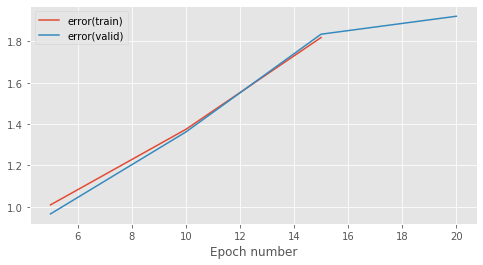

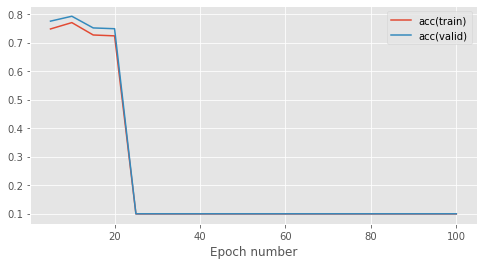

    final error(train) = nan
    final error(valid) = nan
    final acc(train)   = 9.86e-02
    final acc(valid)   = 9.91e-02
    run time per epoch = 4.02


In [9]:
# Set training run hyperparameters
batch_size = 100  # number of data points in a batch
num_epochs = 100  # number of training epochs to perform
stats_interval = 5  # epoch interval between recording and printing stats
learning_rate = 0.01  # learning rate for gradient descent

init_scales = [0.1]  # scale for random parameter initialisation
final_errors_train = []
final_errors_valid = []
final_accs_train = []
final_accs_valid = []

for init_scale in init_scales:

    print('-' * 80)
    print(f'learning_rate={learning_rate} init_scale={init_scale}')
    print('-' * 80)
    # Reset random number generator and data provider states on each run
    # to ensure reproducibility of results
    rng.seed(seed)
    train_data.reset()
    valid_data.reset()

    # Alter data-provider batch size
    train_data.batch_size = batch_size 
    valid_data.batch_size = batch_size

    # Create a parameter initialiser which will sample random uniform values
    # from [-init_scale, init_scale]
    param_init = LeCunNormalInit()

    # Create a model with two affine layers
    hidden_dim = 100 #hidden units
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, param_init, param_init), # we pass an object
        SELULayer(),
        AffineLayer(hidden_dim, output_dim, param_init, param_init)
    ])

    # Initialise a cross entropy error object
    error = CrossEntropySoftmaxError()

    # Use a basic gradient descent learning rule
    learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

    stats, keys, run_time, fig_1, ax_1, fig_2, ax_2 = train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval)
    plt.show()

    print(f'    final error(train) = {stats[-1, keys["error(train)"]]:.2e}')
    print(f'    final error(valid) = {stats[-1, keys["error(valid)"]]:.2e}')
    print(f'    final acc(train)   = {stats[-1, keys["acc(train)"]]:.2e}')
    print(f'    final acc(valid)   = {stats[-1, keys["acc(valid)"]]:.2e}')
    print(f'    run time per epoch = {run_time * 1. / num_epochs:.2f}')

    final_errors_train.append(stats[-1, keys['error(train)']])
    final_errors_valid.append(stats[-1, keys['error(valid)']])
    final_accs_train.append(stats[-1, keys['acc(train)']])
    final_accs_valid.append(stats[-1, keys['acc(valid)']])

<h5>GELU</h5>
We were unable to find any activation functions that specificially improve the performance of GELU. However just out of curiosity, let's examine what happens if we use a GlorotNormalInit. The results from the experiments are shown below.

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=1
--------------------------------------------------------------------------------


Epoch Progress:  76%|███████████████████████████████████████████████▊               | 379/500 [00:02<00:00, 134.83it/s]


Epoch Progress:  42%|██████████████████████████▎                                    | 209/500 [00:01<00:02, 128.51it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 128.54it/s]
Epoch 5: 3.9s to complete
    error(train)=3.62e-01, acc(train)=8.98e-01, error(valid)=3.32e-01, acc(valid)=9.06e-01
Epoch Progress:   8%|█████▏                                                          | 41/500 [00:00<00:03, 131.56it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 138.62it/s]


Epoch Progress:  80%|██████████████████████████████████████████████████▋            | 402/500 [00:02<00:00, 146.53it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 143.06it/s]
Epoch 10: 3.5s to complete
    error(train)=3.09e-01, acc(train)=9.11e-01, error(valid)=2.89e-01, acc(valid)=9.17e-01
Epoch Progress:  58%|████████████████████████████████████▎                          | 288/500 [00:02<00:01, 126.38it/s]


Epoch Progress:  29%|██████████████████▏                                            | 144/500 [00:01<00:02, 140.11it/s]


Epoch Progress:  14%|████████▉                                                       | 70/500 [00:00<00:03, 131.16it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 129.01it/s]
Epoch 15: 3.9s to complete
    error(train)=2.83e-01, acc(train)=9.19e-01, error(valid)=2.68e-01, acc(valid)=9.23e-01
Epoch Progress:  93%|██████████████████████████████████████████████████████████▌    | 465/500 [00:03<00:00, 135.13it/s]


Epoch Progress:  79%|█████████████████████████████████████████████████▉             | 396/500 [00:02<00:00, 160.47it/s]


Epoch Progress:  76%|████████████████████████████████████████████████▏              | 382/500 [00:02<00:00, 152.56it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 148.94it/s]
Epoch 20: 3.4s to complete
    error(train)=2.63e-01, acc(train)=9.25e-01, error(valid)=2.52e-01, acc(valid)=9.27e-01
Epoch Progress:  67%|██████████████████████████████████████████▏                    | 335/500 [00:02<00:01, 149.09it/s]


Epoch Progress:  58%|████████████████████████████████████▍                          | 289/500 [00:02<00:01, 138.65it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 141.64it/s]
Epoch 25: 3.6s to complete
    error(train)=2.46e-01, acc(train)=9.30e-01, error(valid)=2.38e-01, acc(valid)=9.31e-01
Epoch Progress:  44%|███████████████████████████▌                                   | 219/500 [00:01<00:01, 151.99it/s]


Epoch Progress:  38%|███████████████████████▋                                       | 188/500 [00:01<00:02, 137.48it/s]


Epoch Progress:  36%|██████████████████████▍                                        | 178/500 [00:01<00:02, 158.77it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 153.09it/s]
Epoch 30: 3.3s to complete
    error(train)=2.31e-01, acc(train)=9.35e-01, error(valid)=2.25e-01, acc(valid)=9.37e-01
Epoch Progress:  24%|███████████████▏                                               | 121/500 [00:00<00:02, 146.22it/s]


Epoch Progress:  11%|███████                                                         | 55/500 [00:00<00:03, 131.04it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 149.12it/s]
Epoch 35: 3.4s to complete
    error(train)=2.17e-01, acc(train)=9.38e-01, error(valid)=2.14e-01, acc(valid)=9.41e-01
Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


  0%|                                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 136.10it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 153.27it/s]
Epoch 40: 3.3s to complete
    error(train)=2.04e-01, acc(train)=9.42e-01, error(valid)=2.04e-01, acc(valid)=9.46e-01
Epoch Progress:  89%|████████████████████████████████████████████████████████▏      | 446/500 [00:03<00:00, 134.30it/s]


Epoch Progress:  77%|████████████████████████████████████████████████▊              | 387/500 [00:02<00:00, 150.60it/s]


Epoch Progress:  61%|██████████████████████████████████████▎                        | 304/500 [00:02<00:01, 145.89it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 143.93it/s]
Epoch 45: 3.5s to complete
    error(train)=1.94e-01, acc(train)=9.45e-01, error(valid)=1.95e-01, acc(valid)=9.48e-01
Epoch Progress:  38%|████████████████████████▏                                      | 192/500 [00:01<00:02, 146.71it/s]


Epoch Progress:  18%|███████████▌                                                    | 90/500 [00:00<00:02, 146.14it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 134.27it/s]
Epoch 50: 3.7s to complete
    error(train)=1.84e-01, acc(train)=9.48e-01, error(valid)=1.88e-01, acc(valid)=9.50e-01
Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress:  85%|█████████████████████████████████████████████████████▊         | 427/500 [00:03<00:00, 143.65it/s]


Epoch Progress:  66%|█████████████████████████████████████████▍                     | 329/500 [00:02<00:01, 137.09it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 137.18it/s]
Epoch 55: 3.7s to complete
    error(train)=1.75e-01, acc(train)=9.50e-01, error(valid)=1.81e-01, acc(valid)=9.53e-01
Epoch Progress:  42%|██████████████████████████▋                                    | 212/500 [00:01<00:02, 135.87it/s]


Epoch Progress:  23%|██████████████▎                                                | 114/500 [00:00<00:02, 137.65it/s]


Epoch Progress:   9%|█████▌                                                          | 43/500 [00:00<00:03, 135.49it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 138.11it/s]
Epoch 60: 3.6s to complete
    error(train)=1.65e-01, acc(train)=9.53e-01, error(valid)=1.74e-01, acc(valid)=9.54e-01
Epoch Progress:  79%|█████████████████████████████████████████████████▉             | 396/500 [00:03<00:00, 131.90it/s]


Epoch Progress:  50%|███████████████████████████████▏                               | 248/500 [00:01<00:02, 124.53it/s]


Epoch Progress:  24%|███████████████▎                                               | 122/500 [00:00<00:02, 136.99it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 139.39it/s]
Epoch 65: 3.6s to complete
    error(train)=1.58e-01, acc(train)=9.55e-01, error(valid)=1.68e-01, acc(valid)=9.56e-01
Epoch Progress:   6%|███▌                                                            | 28/500 [00:00<00:03, 125.73it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 129.81it/s]


Epoch Progress:  68%|███████████████████████████████████████████                    | 342/500 [00:02<00:01, 139.94it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 123.99it/s]
Epoch 70: 4.1s to complete
    error(train)=1.51e-01, acc(train)=9.57e-01, error(valid)=1.63e-01, acc(valid)=9.56e-01
Epoch Progress:  43%|██████████████████████████▊                                    | 213/500 [00:01<00:01, 148.84it/s]


Epoch Progress:  29%|██████████████████▎                                            | 145/500 [00:01<00:02, 136.41it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 140.45it/s]
Epoch 75: 3.6s to complete
    error(train)=1.44e-01, acc(train)=9.59e-01, error(valid)=1.58e-01, acc(valid)=9.57e-01
Epoch Progress:  11%|███████▎                                                        | 57/500 [00:00<00:03, 134.75it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 137.37it/s]


Epoch Progress:  86%|██████████████████████████████████████████████████████▎        | 431/500 [00:02<00:00, 146.67it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 139.28it/s]
Epoch 80: 3.6s to complete
    error(train)=1.39e-01, acc(train)=9.61e-01, error(valid)=1.54e-01, acc(valid)=9.57e-01
Epoch Progress:  62%|███████████████████████████████████████▏                       | 311/500 [00:02<00:01, 139.62it/s]


Epoch Progress:  53%|█████████████████████████████████▏                             | 263/500 [00:01<00:01, 150.53it/s]


Epoch Progress:  41%|█████████████████████████▊                                     | 205/500 [00:01<00:02, 132.56it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 135.36it/s]
Epoch 85: 3.7s to complete
    error(train)=1.33e-01, acc(train)=9.63e-01, error(valid)=1.50e-01, acc(valid)=9.59e-01
Epoch Progress:   8%|█████                                                           | 40/500 [00:00<00:03, 121.08it/s]


Epoch Progress:  97%|█████████████████████████████████████████████████████████████  | 485/500 [00:03<00:00, 129.39it/s]


Epoch Progress:  76%|████████████████████████████████████████████████               | 381/500 [00:02<00:00, 137.12it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 134.16it/s]
Epoch 90: 3.8s to complete
    error(train)=1.28e-01, acc(train)=9.64e-01, error(valid)=1.47e-01, acc(valid)=9.59e-01
Epoch Progress:  47%|█████████████████████████████▊                                 | 237/500 [00:01<00:01, 142.26it/s]


Epoch Progress:  30%|██████████████████▋                                            | 148/500 [00:01<00:02, 141.56it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 121.37it/s]
Epoch 95: 4.1s to complete
    error(train)=1.24e-01, acc(train)=9.65e-01, error(valid)=1.45e-01, acc(valid)=9.61e-01
Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress:  49%|██████████████████████████████▉                                | 246/500 [00:02<00:02, 124.15it/s]


Epoch Progress:   7%|████▋                                                            | 36/500 [00:00<00:05, 86.14it/s]


Epoch Progress:  78%|█████████████████████████████████████████████████▍             | 392/500 [00:02<00:00, 134.81it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 128.94it/s]
Epoch 100: 3.9s to complete
    error(train)=1.20e-01, acc(train)=9.66e-01, error(valid)=1.42e-01, acc(valid)=9.60e-01
Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [06:35<00:00,  3.96s/it]


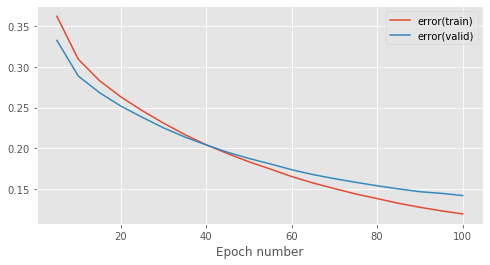

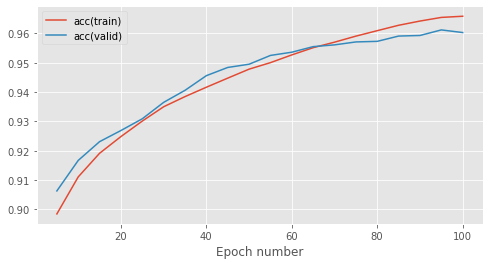

    final error(train) = 1.20e-01
    final error(valid) = 1.42e-01
    final acc(train)   = 9.66e-01
    final acc(valid)   = 9.60e-01
    run time per epoch = 3.97


In [11]:
  # Set training run hyperparameters
batch_size = 100  # number of data points in a batch
num_epochs = 100  # number of training epochs to perform
stats_interval = 5  # epoch interval between recording and printing stats
learning_rate = 0.01  # learning rate for gradient descent

init_scales = [1]  # scale for random parameter initialisation
final_errors_train = []
final_errors_valid = []
final_accs_train = []
final_accs_valid = []

for init_scale in init_scales:

    print('-' * 80)
    print(f'learning_rate={learning_rate} init_scale={init_scale}')
    print('-' * 80)
    # Reset random number generator and data provider states on each run
    # to ensure reproducibility of results
    rng.seed(seed)
    train_data.reset()
    valid_data.reset()

    # Alter data-provider batch size
    train_data.batch_size = batch_size 
    valid_data.batch_size = batch_size

    # Create a parameter initialiser which will sample random uniform values
    # from [-init_scale, init_scale]
    param_init = GlorotNormalInit(gain=1., rng=None) # this is an object

    # Create a model with two affine layers
    hidden_dim = 100 #hidden units
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, param_init, param_init), # we pass an object
        GELULayer(),
        AffineLayer(hidden_dim, output_dim, param_init, param_init)
    ])

    # Initialise a cross entropy error object
    error = CrossEntropySoftmaxError()

    # Use a basic gradient descent learning rule
    learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

    stats, keys, run_time, fig_1, ax_1, fig_2, ax_2 = train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval)
    plt.show()

    print(f'    final error(train) = {stats[-1, keys["error(train)"]]:.2e}')
    print(f'    final error(valid) = {stats[-1, keys["error(valid)"]]:.2e}')
    print(f'    final acc(train)   = {stats[-1, keys["acc(train)"]]:.2e}')
    print(f'    final acc(valid)   = {stats[-1, keys["acc(valid)"]]:.2e}')
    print(f'    run time per epoch = {run_time * 1. / num_epochs:.2f}')

    final_errors_train.append(stats[-1, keys['error(train)']])
    final_errors_valid.append(stats[-1, keys['error(valid)']])
    final_accs_train.append(stats[-1, keys['acc(train)']])
    final_accs_valid.append(stats[-1, keys['acc(valid)']])

It seems that using GlorotNormalInit has reduced the execution runtime per epoch, and it has also achieved the same accuracy.

<h5> ISRLU </h5>
According to the [ISRLU paper], ELU and ISRLU share many of the same characteristics. Thus, the authors suggest using the same weight initialization guidelines as we used for ELUs, referencing back to He at al. Earlier, we examined the performance of the model for ISRLU with init_scales = 0.1. Below we'll conduct an experiments where the scale for the range of the uniform distribution is 1 for ISRLU.

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=1
--------------------------------------------------------------------------------


Epoch Progress:  81%|██████████████████████████████████████████████████▊            | 403/500 [00:03<00:00, 127.63it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 119.76it/s]
Epoch 5: 4.2s to complete
    error(train)=1.92e+00, acc(train)=6.30e-01, error(valid)=1.90e+00, acc(valid)=6.52e-01
Epoch Progress:  17%|██████████▊                                                     | 84/500 [00:00<00:03, 120.11it/s]


Epoch Progress:  49%|██████████████████████████████▋                                | 244/500 [00:02<00:02, 119.65it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 111.01it/s]
Epoch 10: 4.5s to complete
    error(train)=2.04e+00, acc(train)=4.64e-01, error(valid)=2.02e+00, acc(valid)=4.98e-01
Epoch Progress:  80%|██████████████████████████████████████████████████▍            | 400/500 [00:03<00:00, 139.20it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 110.14it/s]
Epoch 15: 4.6s to complete
    error(train)=2.11e+00, acc(train)=4.51e-01, error(valid)=2.10e+00, acc(valid)=4.72e-01
Epoch Progress:  13%|████████▏                                                       | 64/500 [00:00<00:03, 120.41it/s]


Epoch Progress:  54%|█████████████████████████████████▊                             | 268/500 [00:02<00:02, 113.37it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 110.48it/s]
Epoch 20: 4.6s to complete
    error(train)=2.16e+00, acc(train)=2.86e-01, error(valid)=2.14e+00, acc(valid)=3.01e-01
Epoch Progress:  22%|█████████████▊                                                  | 108/500 [00:02<00:14, 27.15it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 114.33it/s]
Epoch 25: 4.4s to complete
    error(train)=2.19e+00, acc(train)=3.32e-01, error(valid)=2.18e+00, acc(valid)=3.46e-01
Epoch Progress:   4%|██▍                                                              | 19/500 [00:00<00:05, 82.39it/s]


Epoch Progress:  59%|█████████████████████████████████████                          | 294/500 [00:03<00:02, 100.37it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 112.10it/s]
Epoch 30: 4.5s to complete
    error(train)=2.21e+00, acc(train)=2.97e-01, error(valid)=2.20e+00, acc(valid)=3.09e-01
Epoch Progress:  58%|████████████████████████████████████▊                          | 292/500 [00:03<00:02, 100.58it/s]


Epoch Progress:   7%|████▏                                                           | 33/500 [00:00<00:04, 105.78it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 112.72it/s]
Epoch 35: 4.5s to complete
    error(train)=2.22e+00, acc(train)=3.10e-01, error(valid)=2.21e+00, acc(valid)=3.31e-01
Epoch Progress:  78%|████████████████████████████████████████████████▉              | 388/500 [00:02<00:00, 139.56it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 134.28it/s]
Epoch 40: 3.8s to complete
    error(train)=2.23e+00, acc(train)=1.90e-01, error(valid)=2.22e+00, acc(valid)=1.96e-01
Epoch Progress:  33%|████████████████████▉                                          | 166/500 [00:01<00:02, 134.95it/s]


Epoch Progress:  89%|███████████████████████████████████████████████████████▉       | 444/500 [00:04<00:00, 121.59it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 108.38it/s]
Epoch 45: 4.6s to complete
    error(train)=2.24e+00, acc(train)=1.96e-01, error(valid)=2.23e+00, acc(valid)=2.01e-01
Epoch Progress:  92%|██████████████████████████████████████████████████████████▏    | 462/500 [00:02<00:00, 150.33it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 150.15it/s]
Epoch 50: 3.4s to complete
    error(train)=2.24e+00, acc(train)=1.79e-01, error(valid)=2.23e+00, acc(valid)=1.92e-01
Epoch Progress:  86%|█████████████████████████████████████████████████████▉         | 428/500 [00:02<00:00, 144.85it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 157.73it/s]
Epoch 55: 3.2s to complete
    error(train)=2.25e+00, acc(train)=2.31e-01, error(valid)=2.24e+00, acc(valid)=2.42e-01
Epoch Progress:  64%|████████████████████████████████████████                       | 318/500 [00:02<00:01, 125.30it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 144.47it/s]
Epoch 60: 3.5s to complete
    error(train)=2.26e+00, acc(train)=2.04e-01, error(valid)=2.25e+00, acc(valid)=2.12e-01
Epoch Progress:  51%|████████████████████████████████▎                              | 256/500 [00:01<00:02, 121.93it/s]


Epoch Progress:  94%|███████████████████████████████████████████████████████████▍   | 472/500 [00:03<00:00, 159.34it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 134.20it/s]
Epoch 65: 3.8s to complete
    error(train)=2.26e+00, acc(train)=1.51e-01, error(valid)=2.25e+00, acc(valid)=1.49e-01
Epoch Progress:  52%|█████████████████████████████████                              | 262/500 [00:01<00:01, 142.19it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 119.09it/s]
Epoch 70: 4.2s to complete
    error(train)=2.26e+00, acc(train)=1.34e-01, error(valid)=2.25e+00, acc(valid)=1.40e-01
Epoch Progress:  16%|██████████▏                                                     | 80/500 [00:00<00:03, 131.13it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 138.97it/s]
Epoch 75: 3.6s to complete
    error(train)=2.27e+00, acc(train)=1.40e-01, error(valid)=2.25e+00, acc(valid)=1.37e-01
Epoch Progress:   3%|██▏                                                             | 17/500 [00:00<00:02, 166.76it/s]


Epoch Progress:   7%|████▌                                                           | 36/500 [00:00<00:04, 111.47it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 137.48it/s]
Epoch 80: 3.7s to complete
    error(train)=2.26e+00, acc(train)=1.87e-01, error(valid)=2.25e+00, acc(valid)=1.92e-01
Experiment Progress:  83%|█████████████████████████████████████████████████▊          | 83/100 [06:11<01:02,  3.68s/it]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 124.29it/s]
Epoch 85: 4.1s to complete
    error(train)=2.27e+00, acc(train)=1.58e-01, error(valid)=2.25e+00, acc(valid)=1.57e-01
Epoch Progress:  57%|████████████████████████████████████                           | 286/500 [00:02<00:01, 131.89it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 139.82it/s]
Epoch 90: 3.6s to complete
    error(train)=2.27e+00, acc(train)=1.66e-01, error(valid)=2.25e+00, acc(valid)=1.67e-01
Epoch Progress:  20%|████████████▌                                                  | 100/500 [00:00<00:03, 103.07it/s]


Experiment Progress:  94%|████████████████████████████████████████████████████████▍   | 94/100 [06:58<00:23,  3.96s/it]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 142.86it/s]
Epoch 95: 3.5s to complete
    error(train)=2.27e+00, acc(train)=1.38e-01, error(valid)=2.26e+00, acc(valid)=1.43e-01
Epoch Progress:  67%|██████████████████████████████████████████▏                    | 335/500 [00:02<00:01, 133.74it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 133.73it/s]
Epoch 100: 3.8s to complete
    error(train)=2.27e+00, acc(train)=1.55e-01, error(valid)=2.26e+00, acc(valid)=1.50e-01
Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [07:23<00:00,  4.43s/it]


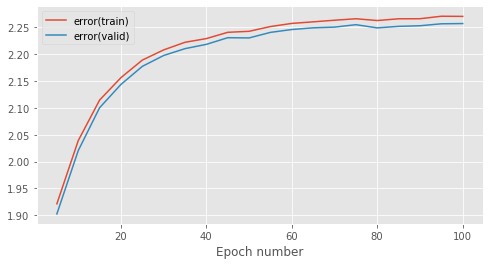

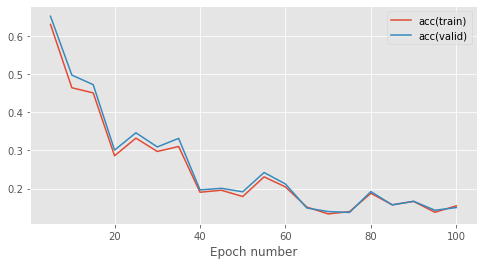

    final error(train) = 2.27e+00
    final error(valid) = 2.26e+00
    final acc(train)   = 1.55e-01
    final acc(valid)   = 1.50e-01
    run time per epoch = 4.45


In [21]:
  # Set training run hyperparameters
batch_size = 100  # number of data points in a batch
num_epochs = 100  # number of training epochs to perform
stats_interval = 5  # epoch interval between recording and printing stats
learning_rate = 0.01  # learning rate for gradient descent

init_scales = [1]  # scale for random parameter initialisation
final_errors_train = []
final_errors_valid = []
final_accs_train = []
final_accs_valid = []

for init_scale in init_scales:

    print('-' * 80)
    print(f'learning_rate={learning_rate} init_scale={init_scale}')
    print('-' * 80)
    # Reset random number generator and data provider states on each run
    # to ensure reproducibility of results
    rng.seed(seed)
    train_data.reset()
    valid_data.reset()

    # Alter data-provider batch size
    train_data.batch_size = batch_size 
    valid_data.batch_size = batch_size

    # Create a parameter initialiser which will sample random uniform values
    # from [-init_scale, init_scale]
    param_init = GlorotNormalInit(gain=1., rng=None) # this is an object

    # Create a model with two affine layers
    hidden_dim = 100 #hidden units
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, param_init, param_init), # we pass an object
        ISRLULayer(alpha=1),
        AffineLayer(hidden_dim, output_dim, param_init, param_init)
    ])

    # Initialise a cross entropy error object
    error = CrossEntropySoftmaxError()

    # Use a basic gradient descent learning rule
    learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

    stats, keys, run_time, fig_1, ax_1, fig_2, ax_2 = train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval)
    plt.show()

    print(f'    final error(train) = {stats[-1, keys["error(train)"]]:.2e}')
    print(f'    final error(valid) = {stats[-1, keys["error(valid)"]]:.2e}')
    print(f'    final acc(train)   = {stats[-1, keys["acc(train)"]]:.2e}')
    print(f'    final acc(valid)   = {stats[-1, keys["acc(valid)"]]:.2e}')
    print(f'    run time per epoch = {run_time * 1. / num_epochs:.2f}')

    final_errors_train.append(stats[-1, keys['error(train)']])
    final_errors_valid.append(stats[-1, keys['error(valid)']])
    final_accs_train.append(stats[-1, keys['acc(train)']])
    final_accs_valid.append(stats[-1, keys['acc(valid)']])

The change in the init_scale did not affect the performance significantly as we still have the problem of the irregular behaviour of the network. Accuracy is, thus, very low. This could be due to the fact that we did not significantly change the nature of the weight initialisation. Perhaps an implementation of Glorot normal initialisation would aid the ISRLU's performance. To do this, we altered the GlorotNormalInit class in initialisers.py so that it is usable to the current situation. Following are the results from this experiment, showing that it does not make that much of a difference with ISRLU for this data set, i.e. the network still suffers from exploding gradient.

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=0.1
--------------------------------------------------------------------------------


Epoch Progress:   7%|████▏                                                           | 33/500 [00:00<00:03, 153.74it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 139.39it/s]
Epoch 5: 3.6s to complete
    error(train)=1.92e+00, acc(train)=6.30e-01, error(valid)=1.90e+00, acc(valid)=6.52e-01
Epoch Progress:  20%|████████████▋                                                   | 99/500 [00:00<00:02, 165.27it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 149.09it/s]
Epoch 10: 3.4s to complete
    error(train)=2.04e+00, acc(train)=4.64e-01, error(valid)=2.02e+00, acc(valid)=4.98e-01
Epoch Progress:  12%|███████▌                                                        | 59/500 [00:00<00:03, 138.11it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 170.66it/s]
Epoch 15: 3.0s to complete
    error(train)=2.11e+00, acc(train)=4.51e-01, error(valid)=2.10e+00, acc(valid)=4.72e-01
Epoch Progress:  55%|██████████████████████████████████▊                            | 276/500 [00:01<00:01, 164.93it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 166.87it/s]
Epoch 20: 3.0s to complete
    error(train)=2.16e+00, acc(train)=2.86e-01, error(valid)=2.14e+00, acc(valid)=3.01e-01
Epoch Progress:  87%|███████████████████████████████████████████████████████        | 437/500 [00:02<00:00, 161.41it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 169.88it/s]
Epoch 25: 3.0s to complete
    error(train)=2.19e+00, acc(train)=3.32e-01, error(valid)=2.18e+00, acc(valid)=3.46e-01
Epoch Progress:  13%|████████▌                                                       | 67/500 [00:00<00:02, 164.01it/s]


Epoch Progress:  62%|███████████████████████████████████████▏                       | 311/500 [00:01<00:00, 193.03it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 175.11it/s]
Epoch 30: 2.9s to complete
    error(train)=2.21e+00, acc(train)=2.97e-01, error(valid)=2.20e+00, acc(valid)=3.09e-01
Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 153.65it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 167.21it/s]
Epoch 35: 3.0s to complete
    error(train)=2.22e+00, acc(train)=3.10e-01, error(valid)=2.21e+00, acc(valid)=3.31e-01
Epoch Progress:  14%|████████▋                                                       | 68/500 [00:00<00:02, 169.08it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 161.43it/s]
Epoch 40: 3.1s to complete
    error(train)=2.23e+00, acc(train)=1.90e-01, error(valid)=2.22e+00, acc(valid)=1.96e-01
Epoch Progress:  59%|█████████████████████████████████████▏                         | 295/500 [00:01<00:01, 184.14it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 163.87it/s]
Epoch 45: 3.1s to complete
    error(train)=2.24e+00, acc(train)=1.96e-01, error(valid)=2.23e+00, acc(valid)=2.01e-01
Experiment Progress:  47%|████████████████████████████▏                               | 47/100 [02:40<02:56,  3.33s/it]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 144.93it/s]
Epoch 50: 3.5s to complete
    error(train)=2.24e+00, acc(train)=1.79e-01, error(valid)=2.23e+00, acc(valid)=1.92e-01
Epoch Progress:  31%|███████████████████▍                                           | 154/500 [00:00<00:01, 182.93it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 173.59it/s]
Epoch 55: 2.9s to complete
    error(train)=2.25e+00, acc(train)=2.31e-01, error(valid)=2.24e+00, acc(valid)=2.42e-01
Epoch Progress:  85%|█████████████████████████████████████████████████████▌         | 425/500 [00:02<00:00, 181.59it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 168.79it/s]
Epoch 60: 3.0s to complete
    error(train)=2.26e+00, acc(train)=2.04e-01, error(valid)=2.25e+00, acc(valid)=2.12e-01
Epoch Progress:  15%|█████████▋                                                      | 76/500 [00:00<00:02, 148.00it/s]


Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 136.13it/s]
Epoch 65: 3.7s to complete
    error(train)=2.26e+00, acc(train)=1.51e-01, error(valid)=2.25e+00, acc(valid)=1.49e-01
Epoch Progress:  35%|██████████████████████▎                                        | 177/500 [00:01<00:02, 159.00it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 170.35it/s]
Epoch 70: 3.0s to complete
    error(train)=2.26e+00, acc(train)=1.34e-01, error(valid)=2.25e+00, acc(valid)=1.40e-01
Epoch Progress:  81%|██████████████████████████████████████████████████▊            | 403/500 [00:02<00:00, 189.64it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 167.99it/s]
Epoch 75: 3.0s to complete
    error(train)=2.27e+00, acc(train)=1.40e-01, error(valid)=2.25e+00, acc(valid)=1.37e-01
Epoch Progress:  28%|█████████████████▍                                             | 138/500 [00:00<00:01, 192.87it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 156.78it/s]
Epoch 80: 3.2s to complete
    error(train)=2.26e+00, acc(train)=1.87e-01, error(valid)=2.25e+00, acc(valid)=1.92e-01
Epoch Progress:  73%|█████████████████████████████████████████████▊                 | 364/500 [00:01<00:00, 187.21it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 179.70it/s]
Epoch 85: 2.8s to complete
    error(train)=2.27e+00, acc(train)=1.58e-01, error(valid)=2.25e+00, acc(valid)=1.57e-01
Epoch Progress:  31%|███████████████████▍                                           | 154/500 [00:00<00:01, 183.77it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 163.55it/s]
Epoch 90: 3.1s to complete
    error(train)=2.27e+00, acc(train)=1.66e-01, error(valid)=2.25e+00, acc(valid)=1.67e-01
Epoch Progress:  57%|███████████████████████████████████▊                           | 284/500 [00:01<00:01, 181.71it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 173.98it/s]
Epoch 95: 2.9s to complete
    error(train)=2.27e+00, acc(train)=1.38e-01, error(valid)=2.26e+00, acc(valid)=1.43e-01
  0%|                                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress:  29%|██████████████████▏                                            | 144/500 [00:00<00:02, 171.47it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 163.28it/s]
Epoch 100: 3.1s to complete
    error(train)=2.27e+00, acc(train)=1.55e-01, error(valid)=2.26e+00, acc(valid)=1.50e-01
Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [05:39<00:00,  3.40s/it]


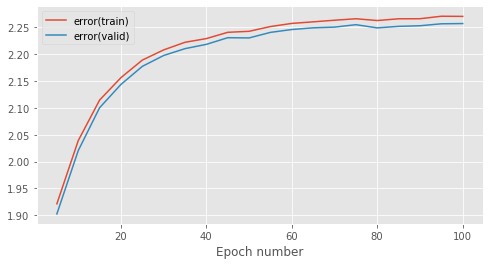

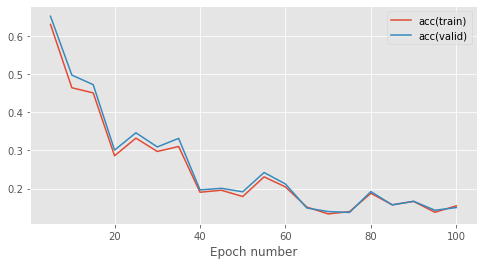

    final error(train) = 2.27e+00
    final error(valid) = 2.26e+00
    final acc(train)   = 1.55e-01
    final acc(valid)   = 1.50e-01
    run time per epoch = 3.41


In [22]:
  # Set training run hyperparameters
batch_size = 100  # number of data points in a batch
num_epochs = 100  # number of training epochs to perform
stats_interval = 5  # epoch interval between recording and printing stats
learning_rate = 0.01  # learning rate for gradient descent

init_scales = [0.1]  # scale for random parameter initialisation
final_errors_train = []
final_errors_valid = []
final_accs_train = []
final_accs_valid = []

for init_scale in init_scales:

    print('-' * 80)
    print(f'learning_rate={learning_rate} init_scale={init_scale}')
    print('-' * 80)
    # Reset random number generator and data provider states on each run
    # to ensure reproducibility of results
    rng.seed(seed)
    train_data.reset()
    valid_data.reset()

    # Alter data-provider batch size
    train_data.batch_size = batch_size 
    valid_data.batch_size = batch_size

    # Create a parameter initialiser which will sample random uniform values
    # from [-init_scale, init_scale]
    param_init = GlorotNormalInit(gain=1., rng=None) # this is an object

    # Create a model with two affine layers
    hidden_dim = 100 #hidden units
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, param_init, param_init), # we pass an object
        ISRLULayer(alpha=1),
        AffineLayer(hidden_dim, output_dim, param_init, param_init)
    ])

    # Initialise a cross entropy error object
    error = CrossEntropySoftmaxError()

    # Use a basic gradient descent learning rule
    learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

    stats, keys, run_time, fig_1, ax_1, fig_2, ax_2 = train_model_and_plot_stats(
        model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval)
    plt.show()

    print(f'    final error(train) = {stats[-1, keys["error(train)"]]:.2e}')
    print(f'    final error(valid) = {stats[-1, keys["error(valid)"]]:.2e}')
    print(f'    final acc(train)   = {stats[-1, keys["acc(train)"]]:.2e}')
    print(f'    final acc(valid)   = {stats[-1, keys["acc(valid)"]]:.2e}')
    print(f'    run time per epoch = {run_time * 1. / num_epochs:.2f}')

    final_errors_train.append(stats[-1, keys['error(train)']])
    final_errors_valid.append(stats[-1, keys['error(valid)']])
    final_accs_train.append(stats[-1, keys['acc(train)']])
    final_accs_valid.append(stats[-1, keys['acc(valid)']])

<h3> Task 1-5 </h3>

Some say that deep learning is as much of an art as it is a science. While many approaches are based on deterministic evidence, often it is empirical findings that best suggest directions in the choices of machine learning engineers. To this end, there are numerous techniques that can help us with improvements in accuracy, training speed, and inference speed. 

<h5> Accuracy </h5>

In terms of accuracy, the architecture of the neural network may play a very significant role. To this end, adding additional layers to the network may help increase its accuracy. Further, changing the weight initialisation parameters may also show some improvements. Changing the activation functions of the network can also have some impact, as shown in an earlier task.
It seems that in this specific case many of the issues for the earlier experiments stem directly from overfitting the models. Thus, perhaps implementing a Dropout layer may be of some assistance. The Dropout layer has been implemented in the layers.py module. The following experiment tests this hypothesis. We're using 0.2 as the probability for neurons to not fire.

--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:  55%|██████████████████████████████████▌                            | 274/500 [00:01<00:02, 106.23it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 148.43it/s]
Epoch 5: 3.4s to complete
    error(train)=2.27e+00, acc(train)=2.09e-01, error(valid)=2.27e+00, acc(valid)=2.02e-01
Epoch Progress:  50%|███████████████████████████████▊                               | 252/500 [00:01<00:01, 148.57it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 133.92it/s]
Epoch 10: 3.8s to complete
    error(train)=1.73e+00, acc(train)=5.94e-01, error(valid)=1.72e+00, acc(valid)=6.10e-01
Epoch Progress:  42%|██████████████████████████▋                                    | 212/500 [00:01<00:01, 163.79it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 133.21it/s]
Epoch 15: 3.8s to complete
    error(train)=1.10e+00, acc(train)=7.52e-01, error(valid)=1.08e+00, acc(valid)=7.74e-01
Epoch Progress:  27%|█████████████████▎                                             | 137/500 [00:01<00:02, 127.89it/s]


Epoch Progress:  10%|██████▎                                                         | 49/500 [00:00<00:03, 142.22it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 123.62it/s]
Epoch 20: 4.1s to complete
    error(train)=8.42e-01, acc(train)=8.04e-01, error(valid)=8.10e-01, acc(valid)=8.25e-01
Epoch Progress:  16%|██████████▎                                                     | 81/500 [00:00<00:02, 192.56it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 139.31it/s]
Epoch 25: 3.6s to complete
    error(train)=6.99e-01, acc(train)=8.34e-01, error(valid)=6.65e-01, acc(valid)=8.50e-01
Epoch Progress:  30%|██████████████████▉                                            | 150/500 [00:01<00:02, 123.92it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 172.46it/s]
Epoch 30: 2.9s to complete
    error(train)=6.11e-01, acc(train)=8.53e-01, error(valid)=5.77e-01, acc(valid)=8.67e-01
Epoch Progress:  58%|████████████████████████████████████▋                          | 291/500 [00:01<00:01, 172.26it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 161.73it/s]
Epoch 35: 3.1s to complete
    error(train)=5.51e-01, acc(train)=8.66e-01, error(valid)=5.17e-01, acc(valid)=8.80e-01
Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 132.14it/s]
Epoch 40: 3.8s to complete
    error(train)=5.11e-01, acc(train)=8.76e-01, error(valid)=4.78e-01, acc(valid)=8.87e-01
Experiment Progress:  40%|████████████████████████                                    | 40/100 [02:36<04:06,  4.10s/it]


Epoch Progress:  83%|████████████████████████████████████████████████████           | 413/500 [00:02<00:00, 150.07it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 138.60it/s]
Epoch 45: 3.7s to complete
    error(train)=4.76e-01, acc(train)=8.82e-01, error(valid)=4.43e-01, acc(valid)=8.93e-01
Epoch Progress:  79%|█████████████████████████████████████████████████▉             | 396/500 [00:02<00:00, 162.25it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 132.77it/s]
Epoch 50: 3.8s to complete
    error(train)=4.51e-01, acc(train)=8.86e-01, error(valid)=4.18e-01, acc(valid)=8.97e-01
Epoch Progress:  42%|██████████████████████████▍                                    | 210/500 [00:01<00:02, 137.34it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 135.54it/s]
Epoch 55: 3.7s to complete
    error(train)=4.30e-01, acc(train)=8.91e-01, error(valid)=3.98e-01, acc(valid)=9.00e-01
Epoch Progress:   2%|█▎                                                               | 10/500 [00:00<00:04, 98.03it/s]


Epoch Progress:  96%|████████████████████████████████████████████████████████████▋  | 482/500 [00:03<00:00, 137.78it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 137.79it/s]
Epoch 60: 3.7s to complete
    error(train)=4.13e-01, acc(train)=8.94e-01, error(valid)=3.82e-01, acc(valid)=9.03e-01
Epoch Progress:  78%|█████████████████████████████████████████████████▎             | 391/500 [00:02<00:00, 133.62it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 134.04it/s]
Epoch 65: 3.8s to complete
    error(train)=3.97e-01, acc(train)=8.97e-01, error(valid)=3.67e-01, acc(valid)=9.07e-01
Epoch Progress:  49%|███████████████████████████████                                | 247/500 [00:01<00:01, 137.33it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 138.75it/s]
Epoch 70: 3.6s to complete
    error(train)=3.85e-01, acc(train)=8.99e-01, error(valid)=3.56e-01, acc(valid)=9.08e-01
Epoch Progress:  25%|████████████████                                               | 127/500 [00:00<00:02, 174.05it/s]


Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 127.20it/s]
Epoch 75: 4.0s to complete
    error(train)=3.74e-01, acc(train)=9.01e-01, error(valid)=3.46e-01, acc(valid)=9.10e-01
Epoch Progress:  48%|██████████████████████████████                                 | 239/500 [00:01<00:01, 140.64it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 109.87it/s]
Epoch 80: 4.6s to complete
    error(train)=3.64e-01, acc(train)=9.03e-01, error(valid)=3.36e-01, acc(valid)=9.12e-01
Experiment Progress:  81%|████████████████████████████████████████████████▌           | 81/100 [05:27<01:27,  4.60s/it]


Epoch Progress:  66%|█████████████████████████████████████████▍                     | 329/500 [00:02<00:01, 142.30it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 123.98it/s]
Epoch 85: 4.1s to complete
    error(train)=3.56e-01, acc(train)=9.05e-01, error(valid)=3.29e-01, acc(valid)=9.13e-01
Epoch Progress:  40%|█████████████████████████▏                                     | 200/500 [00:01<00:02, 142.60it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 125.04it/s]
Epoch 90: 4.0s to complete
    error(train)=3.49e-01, acc(train)=9.07e-01, error(valid)=3.22e-01, acc(valid)=9.14e-01
Epoch Progress:  17%|██████████▉                                                     | 85/500 [00:00<00:02, 138.34it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 144.67it/s]
Epoch 95: 3.5s to complete
    error(train)=3.40e-01, acc(train)=9.08e-01, error(valid)=3.13e-01, acc(valid)=9.16e-01
Epoch Progress:  95%|█████████████████████████████████████████████████████████████   | 477/500 [00:05<00:00, 61.80it/s]


Epoch Progress:  24%|███████████████▏                                               | 121/500 [00:00<00:02, 130.54it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:04<00:00, 110.31it/s]
Epoch 100: 4.6s to complete
    error(train)=3.34e-01, acc(train)=9.09e-01, error(valid)=3.08e-01, acc(valid)=9.17e-01
Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [06:50<00:00,  4.10s/it]


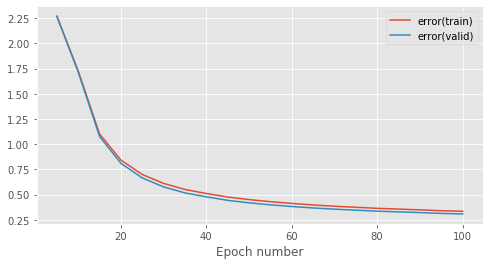

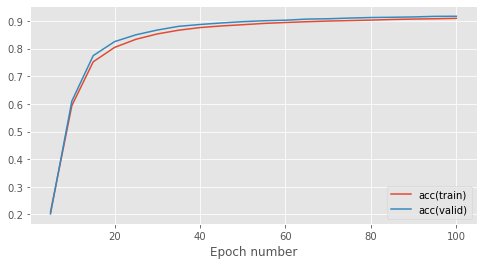

    final error(train) = 3.34e-01
    final error(valid) = 3.08e-01
    final acc(train)   = 9.09e-01
    final acc(valid)   = 9.17e-01
    run time per epoch = 4.12


In [20]:
batch_size = 100  # number of data points in a batch
num_epochs = 100  # number of training epochs to perform
stats_interval = 5  # epoch interval between recording and printing stats
learning_rate = 0.01  # learning rate for gradient descent

init_scales = [0.01]  # scale for random parameter initialisation
final_errors_train = []
final_errors_valid = []
final_accs_train = []
final_accs_valid = []

for init_scale in init_scales:
    print('-' * 80)
    print(f'learning_rate={learning_rate} init_scale={init_scale}')
    print('-' * 80)
    # Reset random number generator and data provider states on each run
    # to ensure reproducibility of results
    rng.seed(seed)
    train_data.reset()
    valid_data.reset()

    # Alter data-provider batch size
    train_data.batch_size = batch_size 
    valid_data.batch_size = batch_size

    # Create a parameter initialiser which will sample random uniform values
    # from [-init_scale, init_scale]
    param_init = UniformInit(-init_scale, init_scale, rng=rng)

    # Create a model with two affine layers
    hidden_dim = 100 #hidden units
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, param_init, param_init),
        ReluLayer(),
        DropoutLayer(rng, 0.2),
        AffineLayer(hidden_dim, output_dim, param_init, param_init)
    ])

        # Initialise a cross entropy error object
    error = CrossEntropySoftmaxError()

    # Use a basic gradient descent learning rule
    learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

    stats, keys, run_time, fig_1, ax_1, fig_2, ax_2 = train_model_and_plot_stats(
            model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval)
    plt.show()

    print(f'    final error(train) = {stats[-1, keys["error(train)"]]:.2e}')
    print(f'    final error(valid) = {stats[-1, keys["error(valid)"]]:.2e}')
    print(f'    final acc(train)   = {stats[-1, keys["acc(train)"]]:.2e}')
    print(f'    final acc(valid)   = {stats[-1, keys["acc(valid)"]]:.2e}')
    print(f'    run time per epoch = {run_time * 1. / num_epochs:.2f}')

    final_errors_train.append(stats[-1, keys['error(train)']])
    final_errors_valid.append(stats[-1, keys['error(valid)']])
    final_accs_train.append(stats[-1, keys['acc(train)']])
    final_accs_valid.append(stats[-1, keys['acc(valid)']])

We added a dropout layer with the intention to increase the accuracy, however in this specific case this was not achieved. The model is certainly not overfitting, and we're achieving a decent validation accuracy. It's important to note that just because this specific experiment does not indicate the usefulness of the Dropout layer, this is not a generalisable statement. However in this specific example, our hypothesis did not hold.

<h5> Training speed </h5>

The use of optimisers has been previously shown to improve the convergence to a solution. Techniques such as Gradient descent with momentum (similar to standard gradient descent, but gains momentum as the network converges to a solution), RMSprop (alters the learning rade so that it's reduced faster for parameters where the gradient is large and vice versa) or the Adam optimiser (similar to RMSprop, but with added momentu optimisation) have been found to reduce training speed drastically.

Increasing the batch size would result in fewer computations to be completed since more inputs would be processed at one time.

Increasing the learning rate would also result in a faster convergence, although this comes with additional possible disadvantages of possible missing the optimal solution.

Generally, lowering the complexity of the network as a whole would result in lower training times. To this end, we could reduce the number of hidden units (as shown in Task 1-2, decreasing the hidden units resulted in a faster runtime per epoch), or reduce the number of hiden layers (the experiments in Task 1-2 also show that the chosen simpler architecture was generally faster than the 'deeper' one). An additional way to lower the complexity would be to implement a convolutional layer which would operate with kernels of a size smaller than the initial dimensions. This in turn would reduce the dimensionality of the data overall, and would result in shorter training speed.

Finally, a reduction of the training epochs would also make the training time shorter. In this specific case, it would be also helpful to reduce the epoch number since many of the experiments overfit using 100 epochs.

Prior experiments have tinkered with increased learning rate (leading to overfitting, which could be fixed and appropriate with fewer epochs), lowering the number of hidden units (which made it faster, but reduced the accuracy), the batch size (slower runtime, higher accuracy). Evidently, when playing around with these parameters, it's important to keep in mind that it's a trade-off between training speed and accuracy.

However, as an experiment, we propose a funnel-like architecture, where we gradually reduce the size of the hidden units. Thus we begin with the initial input_dim, and we reduce the hidden_dim for each layer. We will compare these results with the 'deeper' architecture suggested in Task 1-2.


--------------------------------------------------------------------------------
learning_rate=0.01 init_scale=0.01
--------------------------------------------------------------------------------


Epoch Progress:  58%|████████████████████████████████████▊                          | 292/500 [00:01<00:01, 183.57it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 182.57it/s]
Epoch 5: 2.8s to complete
    error(train)=2.30e+00, acc(train)=1.14e-01, error(valid)=2.30e+00, acc(valid)=1.06e-01
Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 208.45it/s]
Epoch 10: 2.4s to complete
    error(train)=2.30e+00, acc(train)=1.14e-01, error(valid)=2.30e+00, acc(valid)=1.06e-01
Epoch Progress:  11%|███████▎                                                        | 57/500 [00:00<00:03, 133.91it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 148.98it/s]
Epoch 15: 3.4s to complete
    error(train)=1.64e+00, acc(train)=4.09e-01, error(valid)=1.62e+00, acc(valid)=4.20e-01
Epoch Progress:  37%|███████████████████████▌                                       | 187/500 [00:00<00:01, 252.19it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 228.75it/s]
Epoch 20: 2.2s to complete
    error(train)=7.16e-01, acc(train)=7.79e-01, error(valid)=6.72e-01, acc(valid)=8.02e-01
Epoch Progress:  42%|██████████████████████████▋                                    | 212/500 [00:00<00:01, 266.89it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 174.32it/s]
Epoch 25: 2.9s to complete
    error(train)=5.45e-01, acc(train)=8.42e-01, error(valid)=5.08e-01, acc(valid)=8.53e-01
  0%|                                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 245.84it/s]
Epoch 30: 2.1s to complete
    error(train)=4.50e-01, acc(train)=8.74e-01, error(valid)=4.19e-01, acc(valid)=8.80e-01
Experiment Progress:  33%|███████████████████▊                                        | 33/100 [01:25<02:34,  2.31s/it]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 216.67it/s]
Epoch 35: 2.3s to complete
    error(train)=3.54e-01, acc(train)=9.00e-01, error(valid)=3.32e-01, acc(valid)=9.08e-01
Epoch Progress:  38%|████████████████████████▏                                      | 192/500 [00:01<00:01, 196.30it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 242.59it/s]
Epoch 40: 2.1s to complete
    error(train)=2.83e-01, acc(train)=9.21e-01, error(valid)=2.69e-01, acc(valid)=9.24e-01
Epoch Progress:  94%|██████████████████████████████████████████████████████████▉    | 468/500 [00:02<00:00, 208.22it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 178.87it/s]
Epoch 45: 2.8s to complete
    error(train)=2.39e-01, acc(train)=9.32e-01, error(valid)=2.30e-01, acc(valid)=9.36e-01
Epoch Progress:  77%|████████████████████████████████████████████████▋              | 386/500 [00:01<00:00, 148.09it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 190.59it/s]
Epoch 50: 2.7s to complete
    error(train)=2.07e-01, acc(train)=9.40e-01, error(valid)=2.05e-01, acc(valid)=9.42e-01
Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 238.15it/s]
Epoch 55: 2.1s to complete
    error(train)=1.83e-01, acc(train)=9.47e-01, error(valid)=1.85e-01, acc(valid)=9.47e-01
Epoch Progress:  70%|███████████████████████████████████████████▉                   | 349/500 [00:01<00:00, 264.71it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 240.29it/s]
Epoch 60: 2.1s to complete
    error(train)=1.62e-01, acc(train)=9.54e-01, error(valid)=1.68e-01, acc(valid)=9.53e-01
Epoch Progress:  80%|██████████████████████████████████████████████████▍            | 400/500 [00:01<00:00, 261.24it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 213.25it/s]
Epoch 65: 2.4s to complete
    error(train)=1.47e-01, acc(train)=9.59e-01, error(valid)=1.55e-01, acc(valid)=9.57e-01
Epoch Progress:  58%|████████████████████████████████████▋                          | 291/500 [00:01<00:01, 190.41it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 232.48it/s]
Epoch 70: 2.2s to complete
    error(train)=1.34e-01, acc(train)=9.62e-01, error(valid)=1.47e-01, acc(valid)=9.58e-01
Epoch Progress:  28%|█████████████████▊                                             | 141/500 [00:00<00:01, 229.93it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 209.94it/s]
Epoch 75: 2.4s to complete
    error(train)=1.23e-01, acc(train)=9.65e-01, error(valid)=1.40e-01, acc(valid)=9.60e-01
Epoch Progress:  51%|███████████████████████████████▉                               | 253/500 [00:01<00:01, 174.76it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 178.22it/s]
Epoch 80: 2.8s to complete
    error(train)=1.13e-01, acc(train)=9.68e-01, error(valid)=1.33e-01, acc(valid)=9.61e-01
Epoch Progress:  63%|███████████████████████████████████████▌                       | 314/500 [00:01<00:00, 243.45it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 226.17it/s]
Epoch 85: 2.2s to complete
    error(train)=1.06e-01, acc(train)=9.70e-01, error(valid)=1.31e-01, acc(valid)=9.62e-01
Epoch Progress:   0%|                                                                          | 0/500 [00:00<?, ?it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 212.08it/s]
Epoch 90: 2.4s to complete
    error(train)=9.82e-02, acc(train)=9.72e-01, error(valid)=1.25e-01, acc(valid)=9.63e-01
Epoch Progress:  22%|█████████████▉                                                 | 111/500 [00:00<00:01, 207.28it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 198.21it/s]
Epoch 95: 2.6s to complete
    error(train)=9.11e-02, acc(train)=9.74e-01, error(valid)=1.21e-01, acc(valid)=9.65e-01
Epoch Progress:  40%|█████████████████████████▍                                     | 202/500 [00:00<00:01, 217.45it/s]


Epoch Progress: 100%|███████████████████████████████████████████████████████████████| 500/500 [00:02<00:00, 207.16it/s]
Epoch 100: 2.4s to complete
    error(train)=8.52e-02, acc(train)=9.76e-01, error(valid)=1.19e-01, acc(valid)=9.66e-01
Experiment Progress: 100%|███████████████████████████████████████████████████████████| 100/100 [04:18<00:00,  2.58s/it]


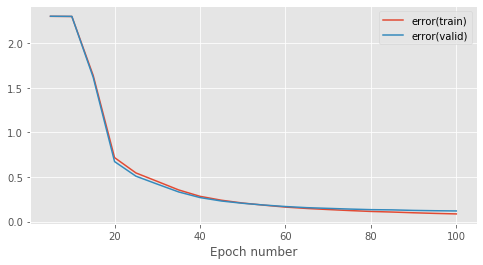

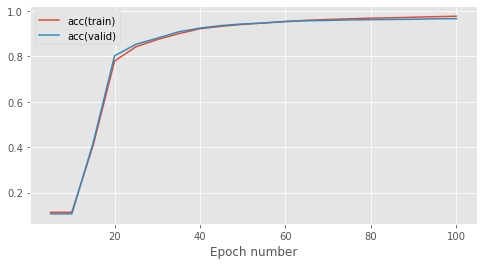

    final error(train) = 8.52e-02
    final error(valid) = 1.19e-01
    final acc(train)   = 9.76e-01
    final acc(valid)   = 9.66e-01
    run time per epoch = 2.59


In [24]:
batch_size = 100  # number of data points in a batch
num_epochs = 100  # number of training epochs to perform
stats_interval = 5  # epoch interval between recording and printing stats
learning_rate = 0.01  # learning rate for gradient descent

init_scales = [0.01]  # scale for random parameter initialisation
final_errors_train = []
final_errors_valid = []
final_accs_train = []
final_accs_valid = []

for init_scale in init_scales:
    print('-' * 80)
    print(f'learning_rate={learning_rate} init_scale={init_scale}')
    print('-' * 80)
    # Reset random number generator and data provider states on each run
    # to ensure reproducibility of results
    rng.seed(seed)
    train_data.reset()
    valid_data.reset()

    # Alter data-provider batch size
    train_data.batch_size = batch_size 
    valid_data.batch_size = batch_size

    # Create a parameter initialiser which will sample random uniform values
    # from [-init_scale, init_scale]
    param_init = UniformInit(-init_scale, init_scale, rng=rng)

    # Create a model with two affine layers
    hidden_dim = 100 #hidden units
    model = MultipleLayerModel([
        AffineLayer(input_dim, hidden_dim, param_init, param_init),
        ReluLayer(),
        AffineLayer(hidden_dim, 50, param_init, param_init),
        ReluLayer(),
        AffineLayer(50, output_dim, param_init, param_init)
    ])

        # Initialise a cross entropy error object
    error = CrossEntropySoftmaxError()

    # Use a basic gradient descent learning rule
    learning_rule = GradientDescentLearningRule(learning_rate=learning_rate)

    stats, keys, run_time, fig_1, ax_1, fig_2, ax_2 = train_model_and_plot_stats(
            model, error, learning_rule, train_data, valid_data, num_epochs, stats_interval)
    plt.show()

    print(f'    final error(train) = {stats[-1, keys["error(train)"]]:.2e}')
    print(f'    final error(valid) = {stats[-1, keys["error(valid)"]]:.2e}')
    print(f'    final acc(train)   = {stats[-1, keys["acc(train)"]]:.2e}')
    print(f'    final acc(valid)   = {stats[-1, keys["acc(valid)"]]:.2e}')
    print(f'    run time per epoch = {run_time * 1. / num_epochs:.2f}')

    final_errors_train.append(stats[-1, keys['error(train)']])
    final_errors_valid.append(stats[-1, keys['error(valid)']])
    final_accs_train.append(stats[-1, keys['acc(train)']])
    final_accs_valid.append(stats[-1, keys['acc(valid)']])

The approach took marginally more time with a slightly lower accuracy. The loss in accuracy could be due to the loss of information as we 'funnel' the data through the layes with reduced sizes. The increase in runtime, however, could be due to the execution on a personal laptop and thus many processes could be affecting the experiment.

<h5> Inference speed </h5>

Inference from the model is only one iteration through the network that we have previously trained. Thus, it is strongly correlated with the network complexity and thus the training speed. Using convolutions during the trainig further implies that inference would benefit from the same advantages. There exist techniques to compress the 'knowledge' of a neural network into a simpler one, such as the [paper by Hinton et al](https://arxiv.org/abs/1503.02531).